# Fiducial settings for sampling / optimization + SINF vs SNF

### Setup

In [1]:
import sys
sys.path.insert(1, '/Users/jsull/Documents/berkeley/stats/jax/NFMC_Jax/nfmc_jax/')
import nfmc_jax
import arviz as az
import matplotlib
import getdist
from getdist import plots, MCSamples
import matplotlib.pyplot as plt
import numpy as np
import scipy
import jax
import jax.numpy as jnp
from jax.scipy.special import logsumexp
from jax.scipy.stats import multivariate_normal as mvn
from scipy.stats import multivariate_normal as n_mvn
from jax.scipy.stats import uniform
import chaospy
from nfmc_jax.sinf.RQspline import kde
import torch
from scipy.special import loggamma
import warnings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

seed=1234
np.random.seed(seed)
key = jax.random.PRNGKey(seed)

In [2]:
def t2a(tens): return tens.numpy().astype(np.float64)
def a2t(arr): return torch.from_numpy(arr.astype(np.float32))
def sample_qmodel_1d(qmodel,N,Z=1,dim=0):
    samples,qvalues = qmodel.sample(N,device='cpu')
    #sample n samples
    samples = samples[:,dim]
    #use the sinf kde implementation - should use Scott's rule with no bwfactor
    kdeq = kde(samples)
    def fkde(x):
        return t2a(kdeq(a2t(x)))*Z
    return fkde,samples

def sample_gaussian(N,mean,cov,seed=seed):
    g1 = n_mvn.rvs(mean=mean,cov=cov,size=N,random_state=seed)
    return np.atleast_2d(g1)

def double_sample_gaussian(N,w1,mean1,mean2,cov1,cov2,seed=seed):
    g1 = n_mvn.rvs(mean=mean1,cov=cov1,size=int(N*w1),random_state=seed)
    g2 = n_mvn.rvs(mean=mean2,cov=cov2,size=int(N*(1-w1)),random_state=seed)
    return np.concatenate([np.atleast_2d(g1),np.atleast_2d(g2)])

def sample_truth_1d(N,mean,cov,dim=0):
    mean,cov = np.asarray(mean),np.asarray(cov)
    samples = sample_gaussian(N,mean,cov)
    samples = samples[:,dim]
    kdeq = kde(a2t(samples))
    def fkde(x):
        return t2a(kdeq(a2t(x)))
    return fkde,samples

def double_sample_truth_1d(N,w1,mean1,mean2,cov1,cov2,dim=0):
    mean1,mean2,cov1,cov2 = np.asarray(mean1),np.asarray(mean2),np.asarray(cov1),np.asarray(cov2)
    samples = double_sample_gaussian(N,w1,mean1,mean2,cov1,cov2)
    samples = samples[:,dim]
    kdeq = kde(a2t(samples))
    def fkde(x):
        return t2a(kdeq(a2t(x)))
    return fkde,samples

def log_1d_normal(x,mu=0,sigma=1,n=1):
    return -1/2*( n*np.log(2*np.pi) + sigma + ((x-mu)/sigma)**2 )

def plot_1d_uncorrelated(trace,low,high,n,n_1d=1000,beta_idx=None,sig_scale=1/10):
    qmodels=trace['q_models']
    logp=trace['logp']
    samples=trace['q_samples']
    qnums = np.unique([int(s.split('q')[1].split('_')[0]) for s in list(trace['q_models'][0].keys())])
    mu_truth,sigma_truth = jnp.zeros(n),sig_scale*jnp.ones(n)
    x1_1d = np.linspace(low,high,n_1d)
    if(beta_idx is None): beta_idx=qnums.max()
    truths=[]
    logZpq = trace['logZ'][0]['q{0}_pq_w'.format(beta_idx)]
    for d in range(n):
        plt.plot(x1_1d,
                       sample_qmodel_1d(qmodels[0]['q{0}_w'.format(beta_idx)],n_1d,Z=1,dim=d)[0](x1_1d),
                       ls='-',marker=' ',lw=1,
                       c='C{0}'.format(d),
                      )
        plt.plot(x1_1d,
               sample_qmodel_1d(qmodels[0]['q{0}_uw'.format(beta_idx)],n_1d,Z=1,dim=d)[0](x1_1d),
               ls=':',marker=' ',lw=1,
               c='C{0}'.format(d),
              )
        truths.append(sample_truth_1d(n_1d,mu_truth,sigma_truth,dim=d)[0](x1_1d))
   
    plt.plot(x1_1d,np.mean(np.array(truths),axis=0),c='k',zorder=-1) # just to suppress noise in kde since all the same in uncorrelated...
#     plt.plot(samples[0]['q{0}'.format(beta_idx)],np.exp(logp[0]['q{0}'.format(beta_idx)]),ls=' ',marker='.')
    plt.axvline(0,ls='--',c='k')
    plt.show()
    return 0

def plot_1d_double(trace,low,high,n,n_1d=1000,beta_idx=None,w1=0.3,mu1_diag=0.625, mu2_diag=-0.325,sig_scale=1/10,sig_scale_12=1/2):
    qmodels=trace['q_models']
    logp=trace['logp']
    samples=trace['q_samples']
    qnums = np.unique([int(s.split('q')[1].split('_')[0]) for s in list(trace['q_models'][0].keys())])
    sigma_truth = sig_scale*jnp.ones(n)
    mu1_truth,mu2_truth = mu1_diag*jnp.ones(n),mu2_diag*jnp.ones(n)
    x1_1d = np.linspace(low,high,n_1d)
    if(beta_idx is None): beta_idx=qnums.max()
    truths=[]
    logZpq = trace['logZ'][0]['q{0}_pq_w'.format(beta_idx)]
    for d in range(n):
        plt.plot(x1_1d,
                       sample_qmodel_1d(qmodels[0]['q{0}_w'.format(beta_idx)],n_1d,Z=1,dim=d)[0](x1_1d),
                       ls='-',marker=' ',lw=1,
                       c='C{0}'.format(d),
                      )
        plt.plot(x1_1d,
               sample_qmodel_1d(qmodels[0]['q{0}_uw'.format(beta_idx)],n_1d,Z=1,dim=d)[0](x1_1d),
               ls=':',marker=' ',lw=1,
               c='C{0}'.format(d),
              )
        truths.append(double_sample_truth_1d(n_1d,w1,mu1_truth,mu2_truth,sigma_truth*sig_scale_12,sigma_truth,dim=d)[0](x1_1d))
   
    plt.plot(x1_1d,np.mean(np.array(truths),axis=0),c='k',zorder=-1)
    plt.axvline(mu1_diag,ls='--',c='k')
    plt.axvline(mu2_diag,ls='--',c='k')
    plt.show()
    return 0

def log_like_ducg(x ,w1=0.3,mu1=0.625 ,mu2=-0.325 ,sig_scale=1/10,sig_scale_12=1/2):
    n=x.shape[-1]
    w2=1-w1
    log_like1 = log_like_ucg(x,mu_diag=mu1,sig_scale=sig_scale*sig_scale_12) #make first narrower like before
    log_like2 = log_like_ucg(x,mu_diag=mu2,sig_scale=sig_scale)
    return  logsumexp(jnp.array([jnp.log(w1) + log_like1, jnp.log(w2) + log_like2]), axis=0)

def log_like_ucg(x,mu_diag=0,sig_scale=1/10):
    n=x.shape[-1]
    mu,sigma = mu_diag*jnp.ones(n),sig_scale*jnp.ones(n)
    return -0.5 * jnp.log((2 * jnp.pi)**n * jnp.prod(sigma** 2) ) - 0.5 * jnp.dot((x - mu)**2 , (1/ (2 * sigma ** 2)))

In [3]:
def plot_corr_gd(trace,Cov,Ngd=1000,beta_idx=None):
    qmodels=trace['q_models']
    logp=trace['logp']
    samples=trace['q_samples']
    qnums = np.unique([int(s.split('q')[1].split('_')[0]) for s in list(trace['q_models'][0].keys())])
    names = ["x%s"%i for i in range(n)]
    labels =  ["x_%s"%i for i in range(n)]

    truth = n_mvn.rvs(mean=np.zeros(n),cov=Cov,size=Ngd)
    truth_gd = MCSamples(samples=truth,names = names, labels = labels, label='truth')

    if(beta_idx is None): beta_idx=qnums.max()
    s_w,s_uw = t2a(qmodels[0]['q{0}_w'.format(beta_idx)].sample(Ngd,device='cpu')[0]),t2a(qmodels[0]['q{0}_uw'.format(beta_idx)].sample(Ngd,device='cpu')[0])
    samples_w = MCSamples(samples=s_w,names = names, labels = labels, label='q_w')
    samples_uw = MCSamples(samples=s_uw,names = names, labels = labels, label='q_uw')

    # Triangle plot
    g = plots.get_subplot_plotter()
    g.triangle_plot([samples_uw,truth_gd,samples_w], filled=True)
    plt.show()
    
def plot_corr_grv(trace,Ngd=1000,beta_idx=None):
    qmodels=trace['q_models']
    logp=trace['logp']
    samples=trace['q_samples']
    qnums = np.unique([int(s.split('q')[1].split('_')[0]) for s in list(trace['q_models'][0].keys())])
    names = ["x%s"%i for i in range(n)]
    labels =  ["x_%s"%i for i in range(n)]

    #sample double gaussian
    truth = np.concatenate([n_mvn.rvs(mean=mu1_grv,cov=1,size=int(Ngd*2/3)),
                           n_mvn.rvs(mean=mu2_grv,cov=1,size=int(Ngd*1/3))])
    truth_gd = MCSamples(samples=truth,names = names, labels = labels, label='truth')

    if(beta_idx is None): beta_idx=qnums.max()
    print(beta_idx)
    s_w,s_uw = t2a(qmodels[0]['q{0}_w'.format(beta_idx)].sample(Ngd,device='cpu')[0]),t2a(qmodels[0]['q{0}_uw'.format(beta_idx)].sample(Ngd,device='cpu')[0])
    samples_w = MCSamples(samples=s_w,names = names, labels = labels, label='q_w')
    samples_uw = MCSamples(samples=s_uw,names = names, labels = labels, label='q_uw')

    # Triangle plot
    g = plots.get_subplot_plotter()
    g.triangle_plot([samples_uw,truth_gd,samples_w], filled=True)
    plt.savefig('grv_test_fid_v0.png',facecolor='white')
    plt.show()
    
def plot_opt_gd(trace,opt_func,low,up,Ngd=1000,beta_idx=None):
    qmodels=trace['q_models']
    logp=trace['logp']
    samples=trace['q_samples']
    qnums = np.unique([int(s.split('q')[1].split('_')[0]) for s in list(trace['q_models'][0].keys())])
    names = ["x%s"%i for i in range(n)]
    labels =  ["x_%s"%i for i in range(n)]

    #for truth, evaluate on sobol points and apply weights
    sobol = np.atleast_2d(chaospy.Iid(chaospy.Uniform(lower=low,upper=up),n).sample(Ngd,rule='sobol')).T
    truth = np.array([np.exp(opt_func(n,sobol[i])) for i in range(Ngd)]) #obviously this will be slow
    truth_gd = MCSamples(samples=sobol, weights=truth, names = names, labels = labels, label='truth')

    if(beta_idx is None): beta_idx=qnums.max()
    s_w,s_uw = t2a(qmodels[0]['q{0}_w'.format(beta_idx)].sample(Ngd,device='cpu')[0]),t2a(qmodels[0]['q{0}_uw'.format(beta_idx)].sample(Ngd,device='cpu')[0])
    samples_w = MCSamples(samples=s_w,names = names, labels = labels, label='q_w')
    samples_uw = MCSamples(samples=s_uw,names = names, labels = labels, label='q_uw')

    # Triangle plot
    g = plots.get_subplot_plotter()
    g.triangle_plot([samples_uw,truth_gd,samples_w], filled=True)
    plt.show()


In [4]:
#a place to put the common settings to declutter the below but still be transparent
def run_nfo(log_like,log_prior,
    n, #number of sobol points
    low=-1.,
    high=1.,
    knots=None,
    knots_trainable=5,
    bw=1.,
    rel_bw=1,
    layers=5,
    ktrunc=jnp.inf,
    t_ess=0.7,
    beta_max=1.5,
    rel_beta=0.5,
    frac_rel_beta_AF = 1,
    alpha_w = (0,0),
    alpha_uw = (0,0),
    latent_sigma=2.4/(2**2),  #FIXME put this in the code as default
    use_latent_beta2=False,
    use_pq_beta_IW1=False, 
    top_verbose=True,
    verbose=False,
    trainable_qw=True,
    sgd_steps=10,
    gamma=0,
    optimize_directions=False,
    logp_cut=0,
    train_updates=False,
    a=1,
    b=1,
    c=1,
    d=1,
    Ntemp=None,):
    
    ntemp = int(12*n) if(Ntemp is None) else Ntemp
    
    n_prior = 10*n
    n0=n_prior
    N=n_prior
    aN=int(2*N*a)
    bN=n*b
    cN=n*c
    dN=n*d
    if(n<6):
        latent_sigma=1
    else:
        latent_sigma*=((n)**(-1/2))
    dist1d = chaospy.Iid(chaospy.Uniform(lower=low,upper=high),n)
    bounds=np.array([low*np.ones(n),high*np.ones(n)])
    init_prior=dist1d
    init_prior = np.atleast_2d(dist1d.sample(n_prior+1,rule='sobol')).T[1:] #drop first (0,0) sample because cheating
    trace = nfmc_jax.infer_nfomc(log_like, log_prior, jnp.array(init_prior), 
                             log_prior_args=((jnp.array([low]), jnp.array([high]))), 
                             inference_mode="optimization", 
                              vmap=True, parallel_backend=None, 
                               n0=n0,
                               N=N,
                               t_ess=t_ess,
                               N_AF=aN,
                               expl_top_AF=bN,
                               expl_top_qw=cN,
                               expl_latent=dN,
                               bounds=bounds,
                               beta_max=beta_max,
                               nf_iter=1, 
                               N_temp=ntemp,
                               rel_bw=rel_bw,
                               rel_beta=rel_beta,
                               frac_rel_beta_AF = frac_rel_beta_AF,
                               latent_sigma=latent_sigma,
                               use_latent_beta2=use_latent_beta2,
                               use_pq_beta_IW1=use_pq_beta_IW1,
                               k_trunc=ktrunc,
                               #sinf parameters
                               frac_validate=0.0,
                               alpha_w=alpha_w,
                               alpha_uw=alpha_uw,
                               NBfirstlayer=True, 
                               verbose=verbose,
                               top_verbose=top_verbose,interp_nbin=knots,iteration=layers,
                               bw_factor_min=bw,bw_factor_max=bw,bw_factor_num=1, #manually force bw factor
                               trainable_qw=trainable_qw,
                               sgd_steps=sgd_steps,
                               gamma=gamma,
                               knots_trainable=knots_trainable,
                               optimize_directions=optimize_directions,
                               logp_cut=logp_cut,
                               train_updates=train_updates,
                               random_seed=seed
                             )
    
    return trace

def log_flat_prior(x,low,high):
    n=x.shape[-1]
    return -n*jnp.log((high-low))

def plot_Zs(trace,low,high,n,beta_max):
    Zuws = np.array([trace['logZ'][0]['q{0}_pq_uw'.format(i)] for i in range(1,len(trace['betas'][0]))])
    Zws = np.array([trace['logZ'][0]['q{0}_pq_w'.format(i)] for i in range(1,len(trace['betas'][0]))])
    Zts = np.log(np.array([trace['logZ'][0]['q{0}_pq_w_trainable'.format(i)] for i in range(1,len(trace['betas'][0]))]))
    plt.plot(np.array(trace['betas'][0][1:])*beta_max,Zuws,ls=' ',marker='s',label='uw')
    plt.plot(np.array(trace['betas'][0][1:])*beta_max,Zts,ls=' ',marker='d',label='w_t')
    plt.plot(np.array(trace['betas'][0][1:])*beta_max,Zws,ls=' ',marker='.',label='w')
    if(low is not None and high is not None):plt.axhline(np.log((high-low)**-n),ls='--',c='k',zorder=-1,label='prior norm' )
    plt.ylabel(r'$\log Z$')
    plt.legend(prop={"size":10})
    plt.xlabel(r'$\beta$')
    plt.show()

# Dialing in settings
# 1. sampling
$\beta_{\rm{max}}=1$, $\gamma=0$, $Y=0.75$, no top_qw points, $t_{ess}=0.9$

## Correlated Gaussian

In [5]:
n = 5
def get_icov(n,target=200,iseed=seed,eps=1,scale=50):
    condition=0
    eigmax=np.inf
    this_seed=iseed
    while(abs(condition-target)>eps):
        wish = scipy.stats.wishart(df=n, scale=np.eye(n)* scale,seed=this_seed)
        iC = wish.rvs(size=1)
        C = np.linalg.inv(iC)
        eigs = np.linalg.eigvals(C)
        eigmax,eigmin = eigs.max(),eigs.min()
        condition = eigmax/eigmin
        this_seed+=1
    print("PSD: ",np.all(eigs>0))
    print("Condition number: ", condition)
    print("Op norm: ", eigmax)
    return iC,C

iCov,Cov=get_icov(n,eps=1)
def log_like_cg(x,mu_diag=0,icov=iCov):
    n=x.shape[-1]
    mu = mu_diag*jnp.ones(n)
    return -0.5 * ( n*jnp.log( (2 * jnp.pi)) + jnp.log( 1/jnp.linalg.det(icov) )) - 0.5 * jnp.dot((x - mu),jnp.dot(icov,(x - mu)))

PSD:  True
Condition number:  199.54502688948327
Op norm:  0.33203908121598824


In [ ]:
warnings.filterwarnings('ignore')
cg5 = run_nfo(n=n,log_like=log_like_cg,log_prior=log_flat_prior,top_verbose=False,
        beta_max=1,c=0,t_ess=0.9,frac_rel_beta_AF=.75,b=2,d=2)

### b=2,d=2 Y=.75

Removed no burn in
Removed no burn in
Removed no burn in


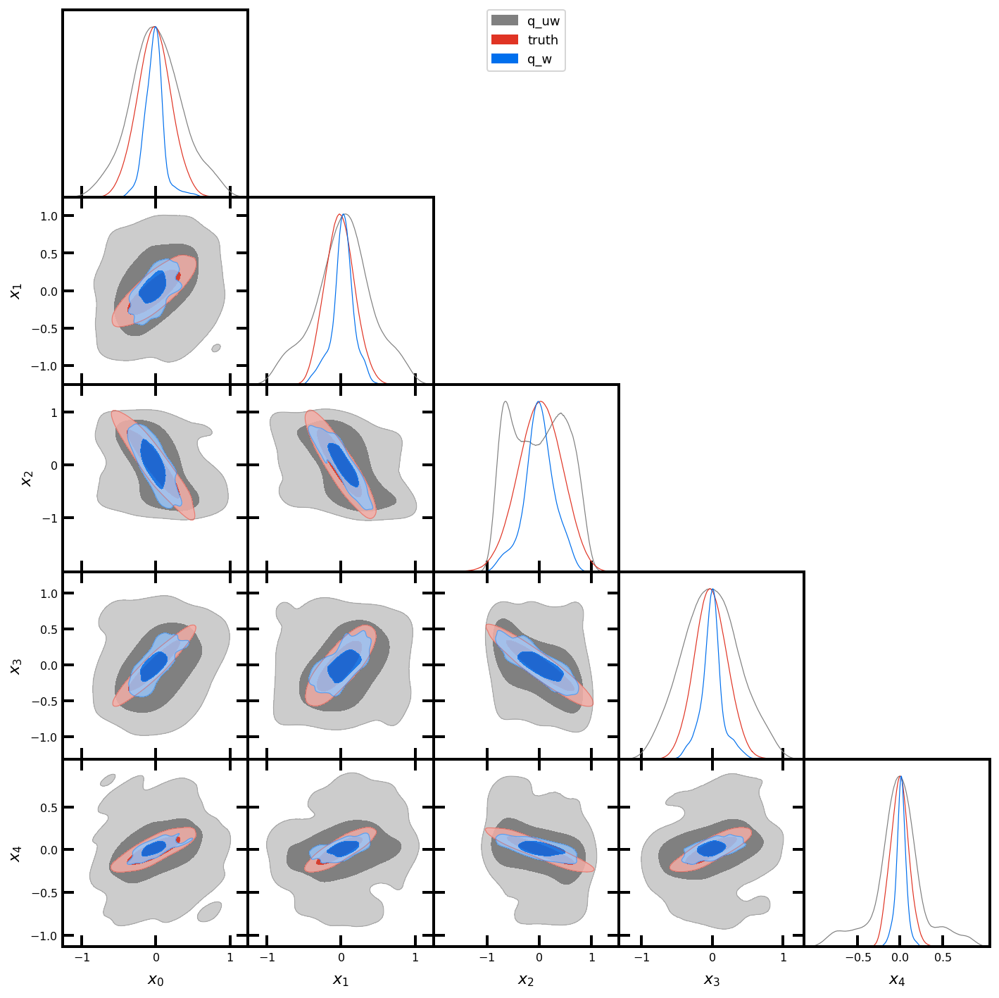

In [52]:
plot_corr_gd(cg5,Cov) 

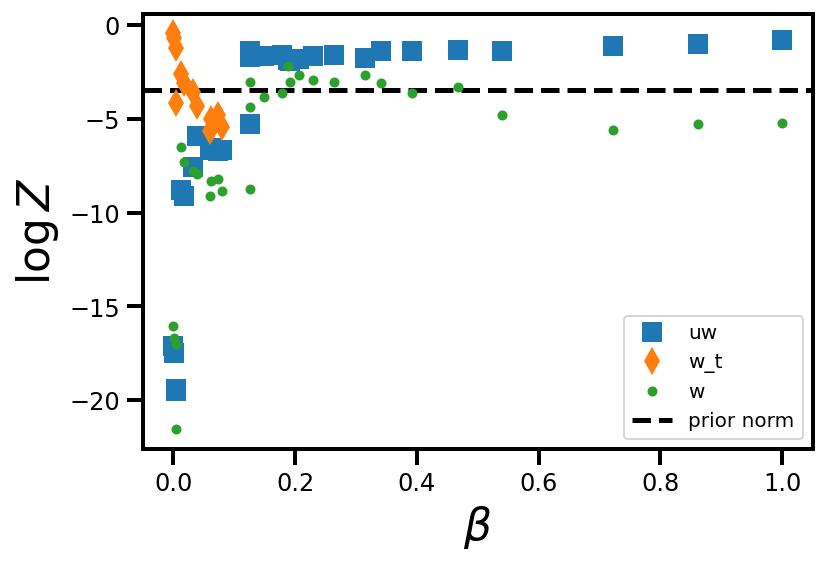

In [75]:
plot_Zs(cg5,-1,1,5,1)

## Forcing $\Delta \beta > 0.01$

In [6]:
warnings.filterwarnings('ignore')
cg5 = run_nfo(n=n,log_like=log_like_cg,log_prior=log_flat_prior,top_verbose=True,
        beta_max=1,c=0,t_ess=0.9,frac_rel_beta_AF=.75,b=2,d=2)

Inference mode is optimization. Maximum beta is: 1
After first quw fit, beta=0.00
ESS3 = 41
beta_prod=0.0100
beta_intern=0.0100
norm-logZ_w_pq = -12.2520
norm-logZ_uw_pq = -13.6587
norm-logZw_t = 1.3252
After first quw fit, beta=0.01
ESS3 = 29
beta_prod=0.0200
beta_intern=0.0200
norm-logZ_w_pq = -14.2764
norm-logZ_uw_pq = -19.8750
norm-logZw_t = -0.5929
After first quw fit, beta=0.02
using beta2=0.01 at idx 1, at stage-1 = 2
ESS3 = 21
beta_prod=0.0300
beta_intern=0.0300
norm-logZ_w_pq = -3.5961
norm-logZ_uw_pq = -2.7779
norm-logZw_t = 0.7136
After first quw fit, beta=0.03
using beta2=0.02 at idx 2, at stage-1 = 3
ESS3 = 31
beta_prod=0.0400
beta_intern=0.0400
norm-logZ_w_pq = -3.7855
norm-logZ_uw_pq = -2.3021
norm-logZw_t = -1.5514
After first quw fit, beta=0.04
using beta2=0.03 at idx 3, at stage-1 = 4
ESS3 = 34
beta_prod=0.0500
beta_intern=0.0500
norm-logZ_w_pq = -1.2178
norm-logZ_uw_pq = 1.7122
norm-logZw_t = nan
After first quw fit, beta=0.05
using beta2=0.03 at idx 3, at stage-1 = 

Removed no burn in
Removed no burn in
Removed no burn in


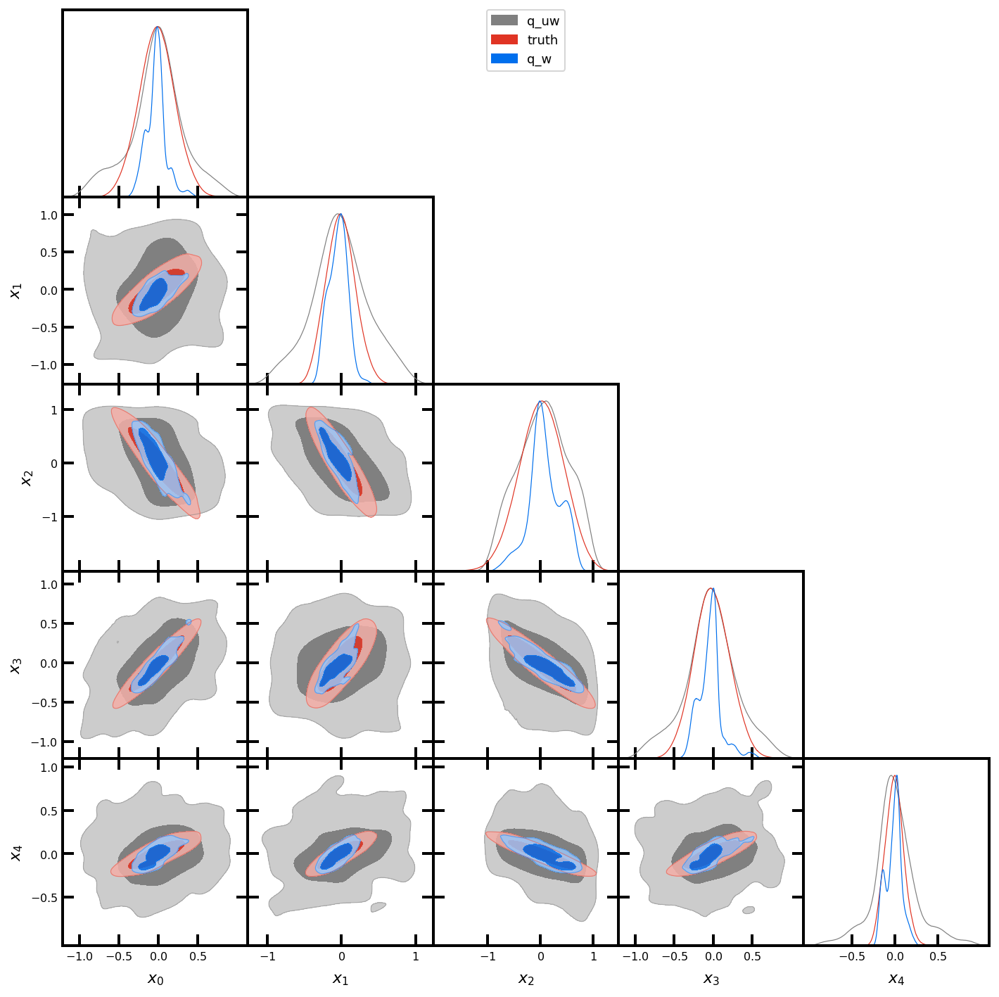

In [7]:
plot_corr_gd(cg5,Cov) 

## Quasi-double Gaussian (from recently-discussed paper)

In [8]:
warnings.filterwarnings('ignore')
n=10
mu1_grv,mu2_grv = jnp.concatenate([jnp.array([8,3]),jnp.zeros(8)]),jnp.concatenate([jnp.array([-2,3]),jnp.zeros(8)])
def log_like_ducg_grv(x): return log_like_ducg(x,w1=2/3,mu1=mu1_grv,mu2=mu2_grv,sig_scale=1,sig_scale_12=1)

In [9]:
grv10 = run_nfo(n=n,log_like=log_like_ducg_grv,log_prior=log_flat_prior,top_verbose=False,
                  low=-5.,high=10.,
                  beta_max=1,c=0,t_ess=0.9,frac_rel_beta_AF=0.5,gamma=0,
                 )

Inference mode is optimization. Maximum beta is: 1


Removed no burn in
46
Removed no burn in
Removed no burn in


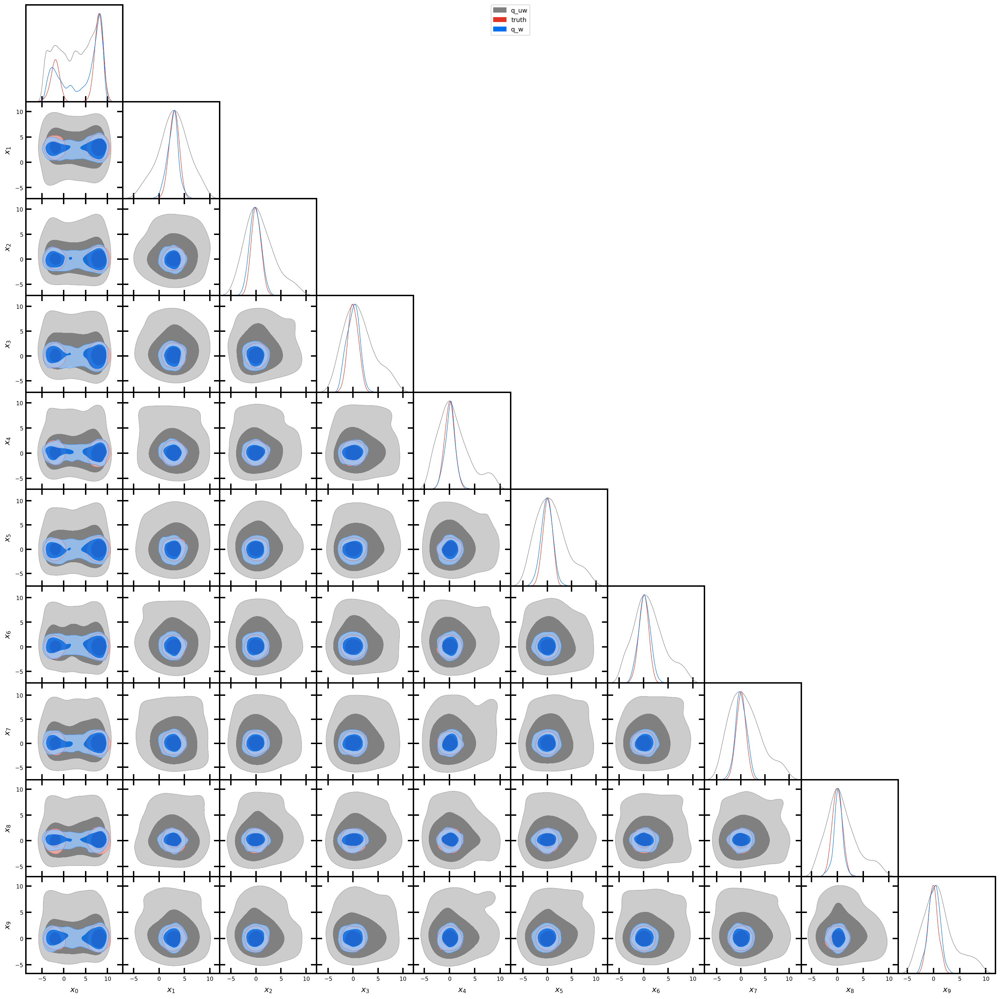

In [62]:
plot_corr_grv(grv10) 

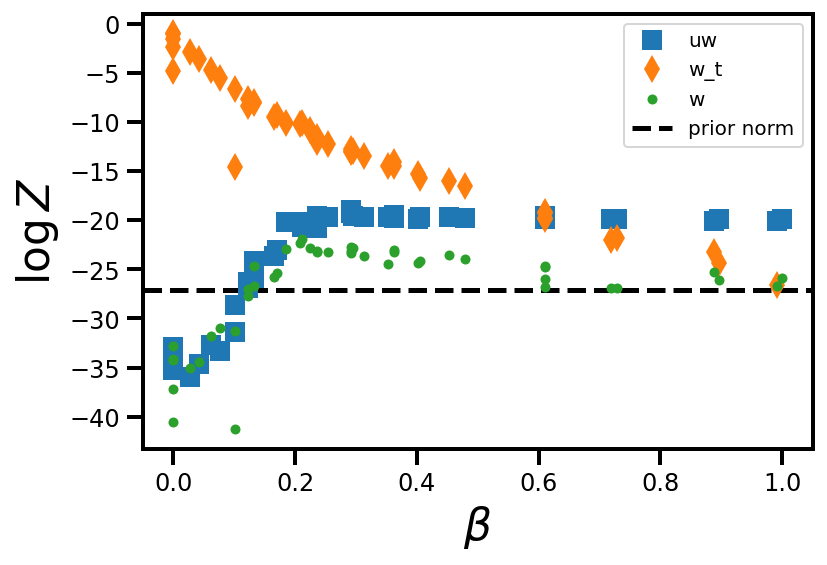

In [76]:
plot_Zs(grv10,-5,10,10,1)

## $\Delta \beta >0.01$

Removed no burn in
41
Removed no burn in
Removed no burn in


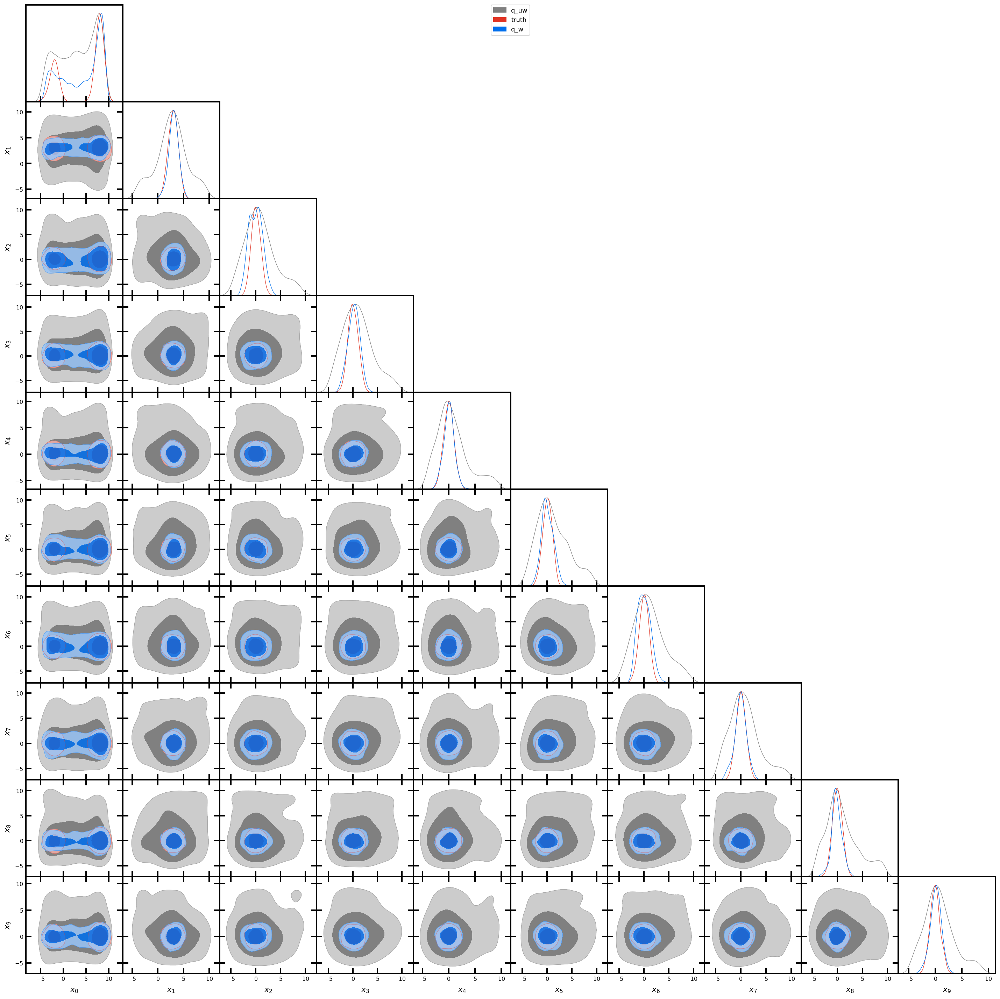

In [10]:
plot_corr_grv(grv10) 

# 2. Optimization
$\beta_{\rm{max}}=d$, $\gamma=0$, $Y=1$, $X=0.75 (1)$, $t_{ess}=0.7$

## Ackley function (d=10)
For some reason this takes much longer with new SINF updates - using exactly the same parameters before I only had 67 betas - here I am getting 100... Final result is similar though.

In [12]:
def log_flat_one(x,low,high): return 0
def log_ack(n,x):
    #global min is at zero, which is one of the sobol points, so slightly shift
    a,b,c = 20,0.2,2*jnp.pi
    term1 = -a * jnp.exp(-b*jnp.sqrt(jnp.mean(x**2)))
    term2 = -jnp.exp(jnp.mean(jnp.cos(c*x)))

    f = term1 + term2 + a + jnp.exp(1)
    return jnp.log(a + jnp.exp(1)-f) #check to make sure always pos

def log_ack10(x): return log_ack(10,x)
n=10
ack10 = run_nfo(n=n,log_like=log_ack10,log_prior=log_flat_one,top_verbose=True,
                   low=-32.768,high=32.768,#this doesn't mean anything for prior, just for bounds
                   beta_max=10,t_ess=0.9
                 )

Inference mode is optimization. Maximum beta is: 10


Removed no burn in
Removed no burn in
Removed no burn in


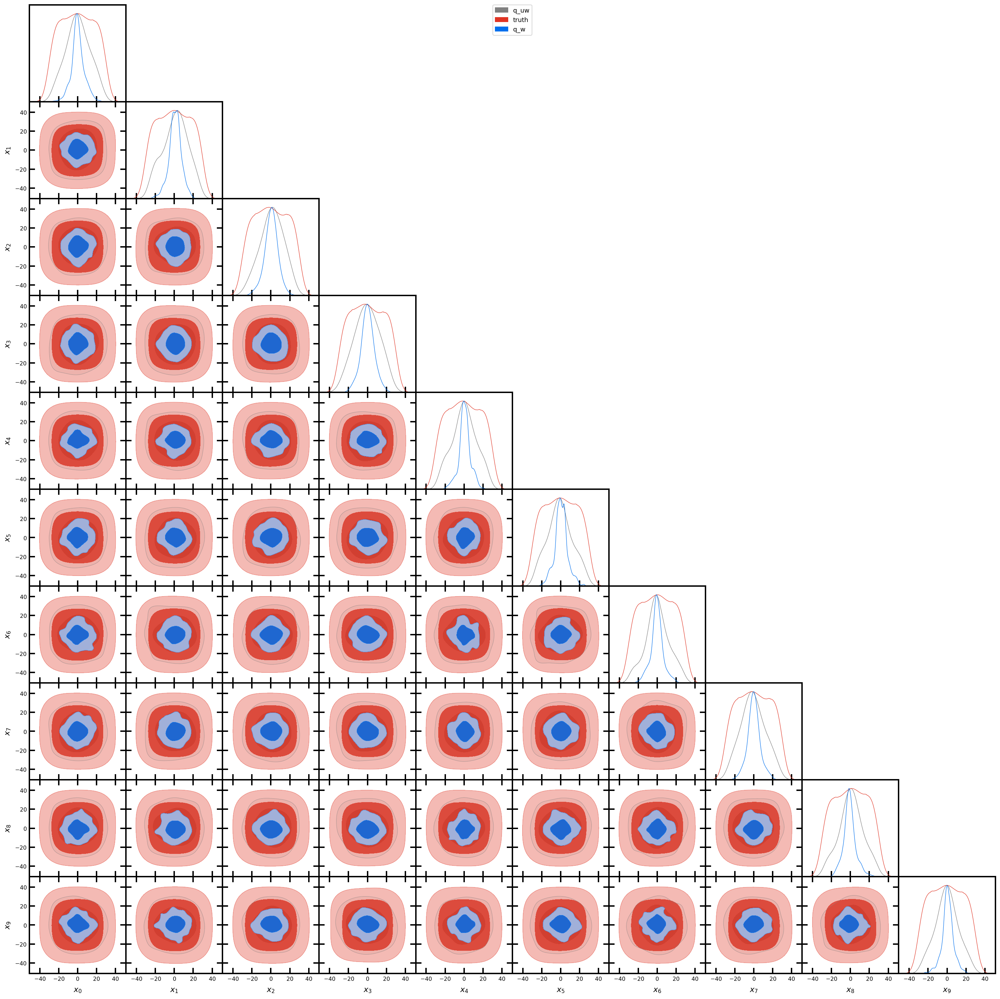

In [10]:
plot_opt_gd(ack10,log_ack,-32.768,32.768,beta_idx=None,Ngd=1000)

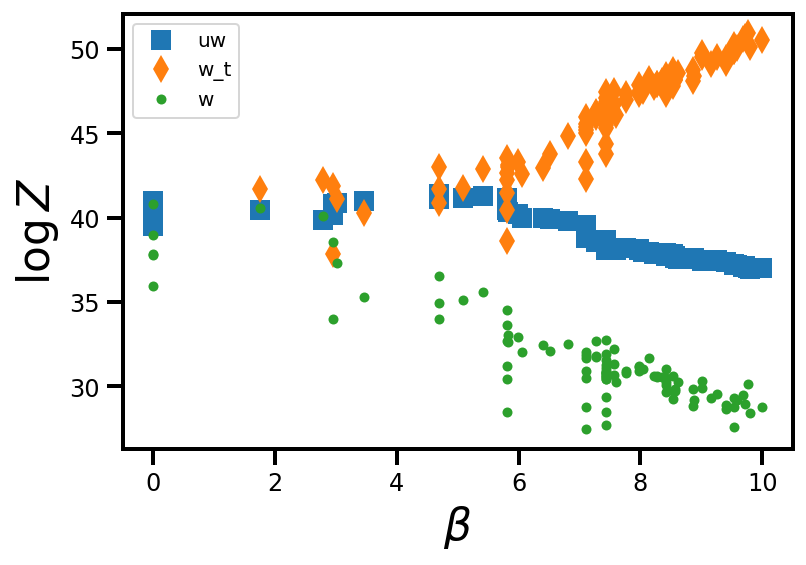

In [23]:
plot_Zs(ack10,None,None,10,10) #no normalization, ackley not normalized to 1
#why does this diverge?

Gap and best value (minimum is zero at zero)

In [15]:
def compute_gap(first,best,opt):
    return (first-best) / (first-opt)
ss,ws = ack10['q_models'][0]['q{0}_w'.format(len(ack10['betas'][0])-1)].sample(10000,device='cpu') #this is not right as is...
best = np.max(t2a(ws))
s_best = t2a(ss[np.argmax(t2a(ws))])
first = np.max(ack10['logp'][0]['q0'])
ss0,ws0 = ack10['q_models'][0]['q1_uw'].sample(10000,device='cpu')
first_uw = np.max(t2a(ws0)) #not sure this makes sense...idea is to find highest point as stand in for first...
sfirst = np.array(ack10['q_samples'][0]['q0'][np.argmax(ack10['logp'][0]['q0'])])
gap = compute_gap(first,best,0.)
print(gap,compute_gap(first_uw,best,0.)) #don't know how to interpret this gap...
print('val= ',best) #seems good

32.34582 0.31942824804329967
val=  -26.194602966308594


## $\Delta \beta >0.01$

Removed no burn in
Removed no burn in
Removed no burn in


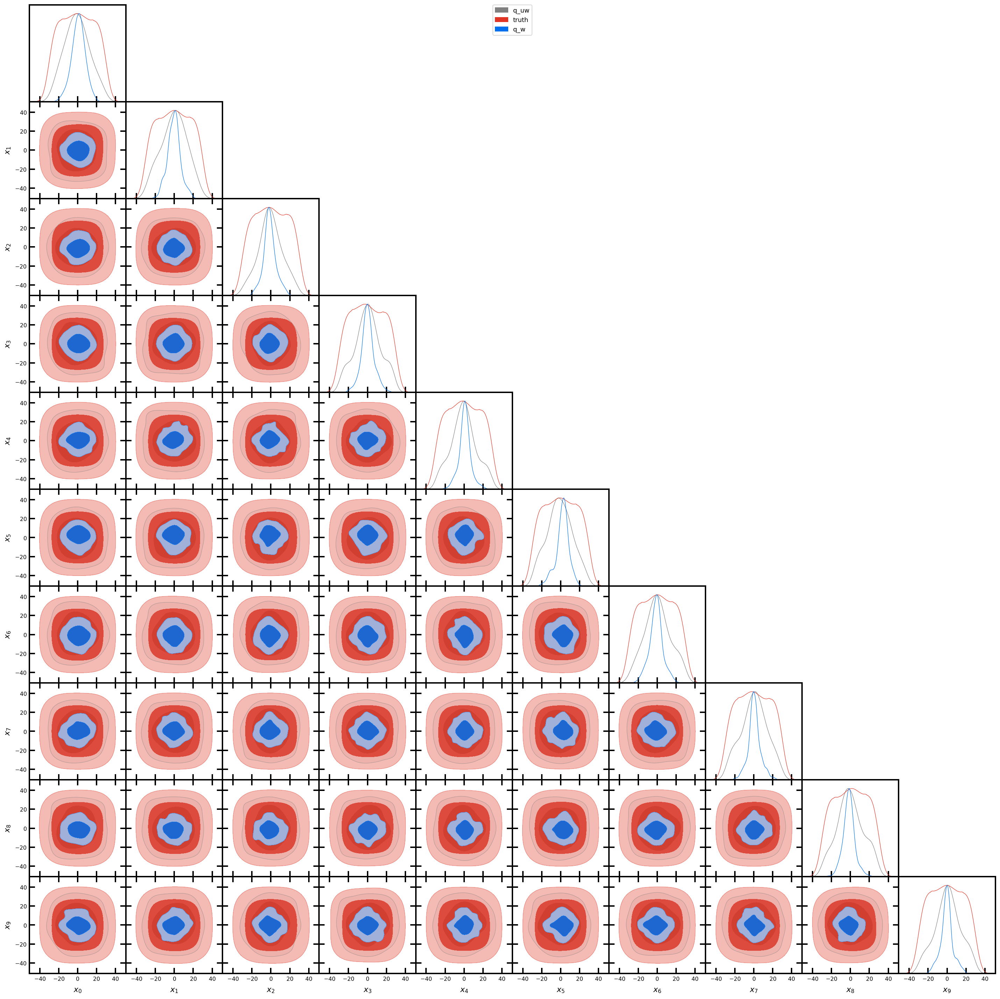

In [13]:
plot_opt_gd(ack10,log_ack,-32.768,32.768,beta_idx=None,Ngd=1000)

In [15]:
len(ack10['betas'][0])

56

In [18]:
def compute_gap(first,best,opt):
    return (first-best) / (first-opt)
ss,ws = ack10['q_models'][0]['q{0}_w'.format(len(ack10['betas'][0])-1)].sample(10000,device='cpu')
best = np.max(t2a(ws))
s_best = t2a(ss[np.argmax(t2a(ws))])
first = np.max(ack10['logp'][0]['q0'])
ss0,ws0 = ack10['q_models'][0]['q1_uw'].sample(10000,device='cpu')
first_uw = np.max(t2a(ws0)) #not sure this makes sense...idea is to find highest point as stand in for first...
sfirst = np.array(ack10['q_samples'][0]['q0'][np.argmax(ack10['logp'][0]['q0'])])
gap = compute_gap(first,best,0.)
print(gap,compute_gap(first_uw,best,0.)) #don't know how to interpret this gap...
print('val= ',best) #seems good

30.140875 0.37058600469201297
val=  -24.352005004882812


# Compare SINF to SNF

## Test single beta step

In [6]:
# SINF
n=10
grv10sinf_1step = run_nfo(n=n,log_like=log_like_ducg_grv,log_prior=log_flat_prior,top_verbose=True,
                  low=-5.,high=10.,
                  beta_max=1,d=2,b=2,t_ess=0.9,frac_rel_beta_AF=0.5,
                  c=0,
                  train_updates=False,
                   sgd_steps=100,
                  Ntemp=2,
                 verbose=True

                 )


Inference mode is optimization. Maximum beta is: 1
No weights in the fit. bw_uw = 1.00 bw_w
After boundary transform logp: -31.33575439453125
Fit spline Time: 0.015448808670043945
logp: -27.15426254272461 time: 0.018552064895629883 iteration: 2
Fit A: Time: 0.010103702545166016 Wasserstein Distance: [2.8180899620056152, 2.81382155418396, 2.7988851070404053, 2.798570394515991, 2.7953622341156006, 2.7940900325775146, 2.788083791732788, 2.7879106998443604, 2.787766695022583, 2.7848098278045654]
Fit spline Time: 0.013936758041381836
logp: -26.894390106201172 time: 0.026200056076049805 iteration: 3
Fit A: Time: 0.009308338165283203 Wasserstein Distance: [2.780400276184082, 2.7767276763916016, 2.7665867805480957, 2.7641026973724365, 2.7630808353424072, 2.7628397941589355, 2.7618980407714844, 2.7594032287597656, 2.7539589405059814, 2.751455783843994]
Fit spline Time: 0.01385498046875
logp: -26.757640838623047 time: 0.025431156158447266 iteration: 4
Fit A: Time: 0.009450912475585938 Wasserstei

Fit spline Time: 0.015569210052490234
logp: -26.349634170532227 time: 0.03008890151977539 iteration: 5
After first quw fit, beta=0.00
weighting fit
After boundary transform logp: -30.636260986328125
Fit spline Time: 0.013314008712768555
logp: -27.08078384399414 time: 0.015297889709472656 iteration: 2
Fit A: Time: 0.00835108757019043 Wasserstein Distance: [2.968494415283203, 2.9494776725769043, 2.9414021968841553, 2.9403772354125977, 2.9359636306762695, 2.925588846206665, 2.9028894901275635, 2.902571439743042, 2.890524387359619, 2.8746252059936523]
Fit spline Time: 0.015399932861328125
logp: -26.735261917114258 time: 0.025860071182250977 iteration: 3
Fit A: Time: 0.007537126541137695 Wasserstein Distance: [2.9280569553375244, 2.92128586769104, 2.9207866191864014, 2.897113084793091, 2.871037721633911, 2.8683812618255615, 2.8678829669952393, 2.8579037189483643, 2.838020086288452, 2.8189783096313477]
Fit spline Time: 0.014292001724243164
logp: -26.547021865844727 time: 0.024049997329711914

In [8]:
# SNF
grv10snf_1step = run_nfo(n=n,log_like=log_like_ducg_grv,log_prior=log_flat_prior,top_verbose=True,
                  low=-5.,high=10.,
                  beta_max=1,d=2,b=2,t_ess=0.9,frac_rel_beta_AF=0.5,
                  c=0,
                  train_updates=True,
                   sgd_steps=100,
                  Ntemp=2,
                  verbose=True
                 )


Inference mode is optimization. Maximum beta is: 1
No weights in the fit. bw_uw = 1.00 bw_w
After boundary transform logp: -31.33575439453125
Fit spline Time: 0.013996124267578125
logp: -27.15426254272461 time: 0.01601576805114746 iteration: 2
Fit A: Time: 0.010087013244628906 Wasserstein Distance: [2.8180899620056152, 2.81382155418396, 2.7988851070404053, 2.798570394515991, 2.7953622341156006, 2.7940900325775146, 2.788083791732788, 2.7879106998443604, 2.787766695022583, 2.7848098278045654]
Fit spline Time: 0.013529777526855469
logp: -26.894390106201172 time: 0.025906085968017578 iteration: 3
Fit A: Time: 0.009732961654663086 Wasserstein Distance: [2.780400276184082, 2.7767276763916016, 2.7665867805480957, 2.7641026973724365, 2.7630808353424072, 2.7628397941589355, 2.7618980407714844, 2.7594032287597656, 2.7539589405059814, 2.751455783843994]
Fit spline Time: 0.01966118812561035
logp: -26.757640838623047 time: 0.03205084800720215 iteration: 4
Fit A: Time: 0.011926651000976562 Wasserste

Epoch 16, Loss 26.80086708, Z 1.000,Time 0.013
Epoch 17, Loss 26.79027367, Z 1.000,Time 0.012
Epoch 18, Loss 26.77986717, Z 1.000,Time 0.013
Epoch 19, Loss 26.76965904, Z 1.000,Time 0.012
Epoch 20, Loss 26.75956917, Z 1.000,Time 0.014
Epoch 21, Loss 26.74978256, Z 1.000,Time 0.015
Epoch 22, Loss 26.74023438, Z 1.000,Time 0.012
Epoch 23, Loss 26.73090744, Z 1.000,Time 0.012
Epoch 24, Loss 26.72159386, Z 1.000,Time 0.011
Epoch 25, Loss 26.71245766, Z 1.000,Time 0.011
Epoch 26, Loss 26.70352554, Z 1.000,Time 0.012
Epoch 27, Loss 26.69463539, Z 1.000,Time 0.011
Epoch 28, Loss 26.68572426, Z 1.000,Time 0.011
Epoch 29, Loss 26.67687416, Z 1.000,Time 0.011
Epoch 30, Loss 26.66820908, Z 1.000,Time 0.011
Epoch 31, Loss 26.65964317, Z 1.000,Time 0.011
Epoch 32, Loss 26.65119171, Z 1.000,Time 0.013
Epoch 33, Loss 26.64276886, Z 1.000,Time 0.014
Epoch 34, Loss 26.63432121, Z 1.000,Time 0.013
Epoch 35, Loss 26.62590790, Z 1.000,Time 0.013
Epoch 36, Loss 26.61745644, Z 1.000,Time 0.012
Epoch 37, Los

Epoch 95, Loss -59.58489990, Z 0.751,Time 0.012
Epoch 96, Loss -58.93375015, Z 0.753,Time 0.012
Epoch 97, Loss -59.12988663, Z 0.752,Time 0.013
Epoch 98, Loss -59.06114960, Z 0.751,Time 0.014
Epoch 99, Loss -59.63663101, Z 0.752,Time 0.012
Log losses are: 1 = -59.53124619, 2 = -59.53124619, 3 = -5.36351919
ESS3 = 19
beta_prod=0.0000
beta_intern=0.0000
norm-logZ_w_pq = -8.0794
norm-logZ_uw_pq = -5.7556
norm-logZw_t = 26.7952
Finished NFO ...


## QDG

In [10]:
grv10snf = run_nfo(n=n,log_like=log_like_ducg_grv,log_prior=log_flat_prior,top_verbose=True,
                  low=-5.,high=10.,
                  beta_max=1,d=2,b=2,t_ess=0.9,frac_rel_beta_AF=0.5,
                  c=0,
                  train_updates=True,
                   sgd_steps=100,
                   verbose=True
                 )

Inference mode is optimization. Maximum beta is: 1
No weights in the fit. bw_uw = 1.00 bw_w
After boundary transform logp: -31.33575439453125
Fit spline Time: 0.016653060913085938
logp: -27.15426254272461 time: 0.019422054290771484 iteration: 2
Fit A: Time: 0.00951385498046875 Wasserstein Distance: [2.8180899620056152, 2.81382155418396, 2.7988851070404053, 2.798570394515991, 2.7953622341156006, 2.7940900325775146, 2.788083791732788, 2.7879106998443604, 2.787766695022583, 2.7848098278045654]
Fit spline Time: 0.017745018005371094
logp: -26.894390106201172 time: 0.0297243595123291 iteration: 3
Fit A: Time: 0.014268875122070312 Wasserstein Distance: [2.780400276184082, 2.7767276763916016, 2.7665867805480957, 2.7641026973724365, 2.7630808353424072, 2.7628397941589355, 2.7618980407714844, 2.7594032287597656, 2.7539589405059814, 2.751455783843994]
Fit spline Time: 0.017260074615478516
logp: -26.757640838623047 time: 0.034291982650756836 iteration: 4
Fit A: Time: 0.012095928192138672 Wasserste

Epoch 16, Loss 26.80086708, Z 1.000,Time 0.013
Epoch 17, Loss 26.79027367, Z 1.000,Time 0.013
Epoch 18, Loss 26.77986717, Z 1.000,Time 0.011
Epoch 19, Loss 26.76965904, Z 1.000,Time 0.012
Epoch 20, Loss 26.75956917, Z 1.000,Time 0.011
Epoch 21, Loss 26.74978256, Z 1.000,Time 0.013
Epoch 22, Loss 26.74023438, Z 1.000,Time 0.011
Epoch 23, Loss 26.73090744, Z 1.000,Time 0.012
Epoch 24, Loss 26.72159386, Z 1.000,Time 0.011
Epoch 25, Loss 26.71245766, Z 1.000,Time 0.011
Epoch 26, Loss 26.70352554, Z 1.000,Time 0.011
Epoch 27, Loss 26.69463539, Z 1.000,Time 0.011
Epoch 28, Loss 26.68572426, Z 1.000,Time 0.011
Epoch 29, Loss 26.67687416, Z 1.000,Time 0.011
Epoch 30, Loss 26.66820908, Z 1.000,Time 0.011
Epoch 31, Loss 26.65964317, Z 1.000,Time 0.010
Epoch 32, Loss 26.65119171, Z 1.000,Time 0.011
Epoch 33, Loss 26.64276886, Z 1.000,Time 0.013
Epoch 34, Loss 26.63432121, Z 1.000,Time 0.014
Epoch 35, Loss 26.62590790, Z 1.000,Time 0.012
Epoch 36, Loss 26.61745644, Z 1.000,Time 0.012
Epoch 37, Los

Epoch 89, Loss -58.84411240, Z 0.752,Time 0.012
Epoch 90, Loss -58.90387344, Z 0.752,Time 0.013
Epoch 91, Loss -59.50661469, Z 0.752,Time 0.012
Epoch 92, Loss -59.49089432, Z 0.751,Time 0.012
Epoch 93, Loss -59.11274719, Z 0.753,Time 0.012
Epoch 94, Loss -59.33948135, Z 0.752,Time 0.017
Epoch 95, Loss -59.58489990, Z 0.751,Time 0.012
Epoch 96, Loss -58.93375015, Z 0.753,Time 0.012
Epoch 97, Loss -59.12988663, Z 0.752,Time 0.011
Epoch 98, Loss -59.06114960, Z 0.751,Time 0.011
Epoch 99, Loss -59.63663101, Z 0.752,Time 0.011
Log losses are: 1 = -59.53124619, 2 = -59.53124619, 3 = -5.36351919
ESS3 = 19
beta_prod=0.0000
beta_intern=0.0000
norm-logZ_w_pq = -8.0794
norm-logZ_uw_pq = -5.7556
norm-logZw_t = 26.7952
Epoch 0, Loss 26.59593582, Z 1.000,Time 0.012
Epoch 1, Loss 26.58577156, Z 1.000,Time 0.014
Epoch 2, Loss 26.57541466, Z 1.000,Time 0.013
Epoch 3, Loss 26.56643677, Z 1.000,Time 0.013
Epoch 4, Loss 26.55850410, Z 1.000,Time 0.013
Epoch 5, Loss 26.55015755, Z 1.000,Time 0.013
Epoch 6,

Epoch 67, Loss -60.08279419, Z 0.745,Time 0.013
Epoch 68, Loss -58.50710678, Z 0.744,Time 0.012
Epoch 69, Loss -57.89484024, Z 0.744,Time 0.015
Epoch 70, Loss -58.13821411, Z 0.744,Time 0.013
Epoch 71, Loss -58.90757370, Z 0.745,Time 0.013
Epoch 72, Loss -59.45337296, Z 0.745,Time 0.013
Epoch 73, Loss -58.89081192, Z 0.744,Time 0.013
Epoch 74, Loss -59.14244080, Z 0.745,Time 0.014
Epoch 75, Loss -59.14165497, Z 0.745,Time 0.012
Epoch 76, Loss -59.52312088, Z 0.744,Time 0.013
Epoch 77, Loss -59.30387497, Z 0.744,Time 0.013
Epoch 78, Loss -59.34408951, Z 0.745,Time 0.014
Epoch 79, Loss -59.86777496, Z 0.745,Time 0.013
Epoch 80, Loss -58.73133469, Z 0.745,Time 0.012
Epoch 81, Loss -58.37742233, Z 0.745,Time 0.013
Epoch 82, Loss -58.98641968, Z 0.745,Time 0.013
Epoch 83, Loss -59.21994781, Z 0.745,Time 0.014
Epoch 84, Loss -59.36067200, Z 0.744,Time 0.013
Epoch 85, Loss -59.36163712, Z 0.745,Time 0.012
Epoch 86, Loss -59.61080170, Z 0.746,Time 0.013
Epoch 87, Loss -59.62152481, Z 0.745,Tim

Epoch 50, Loss -56.36243439, Z 0.751,Time 0.015
Epoch 51, Loss -56.55718613, Z 0.751,Time 0.014
Epoch 52, Loss -56.81299591, Z 0.753,Time 0.015
Epoch 53, Loss -57.06840134, Z 0.752,Time 0.016
Epoch 54, Loss -57.26374054, Z 0.752,Time 0.013
Epoch 55, Loss -57.54779816, Z 0.753,Time 0.012
Epoch 56, Loss -57.62929916, Z 0.751,Time 0.014
Epoch 57, Loss -57.74438477, Z 0.753,Time 0.014
Epoch 58, Loss -58.12211227, Z 0.753,Time 0.013
Epoch 59, Loss -57.93413162, Z 0.753,Time 0.012
Epoch 60, Loss -58.31875610, Z 0.753,Time 0.014
Epoch 61, Loss -57.54406738, Z 0.754,Time 0.013
Epoch 62, Loss -57.76129913, Z 0.754,Time 0.013
Epoch 63, Loss -58.24421692, Z 0.754,Time 0.013
Epoch 64, Loss -57.68560028, Z 0.754,Time 0.014
Epoch 65, Loss -58.18762207, Z 0.754,Time 0.014
Epoch 66, Loss -57.62065506, Z 0.753,Time 0.014
Epoch 67, Loss -57.51542282, Z 0.754,Time 0.013
Epoch 68, Loss -58.22172546, Z 0.754,Time 0.014
Epoch 69, Loss -58.08173752, Z 0.754,Time 0.014
Epoch 70, Loss -58.02295685, Z 0.754,Tim

Epoch 31, Loss -52.34667969, Z 0.723,Time 0.017
Epoch 32, Loss -52.38822174, Z 0.725,Time 0.014
Epoch 33, Loss -52.42904663, Z 0.728,Time 0.015
Epoch 34, Loss -52.46869659, Z 0.730,Time 0.014
Epoch 35, Loss -52.50735092, Z 0.732,Time 0.013
Epoch 36, Loss -52.54678345, Z 0.735,Time 0.013
Epoch 37, Loss -52.58708954, Z 0.737,Time 0.013
Epoch 38, Loss -52.62807083, Z 0.740,Time 0.013
Epoch 39, Loss -52.66978073, Z 0.742,Time 0.013
Epoch 40, Loss -52.71119690, Z 0.745,Time 0.013
Epoch 41, Loss -52.75090790, Z 0.747,Time 0.015
Epoch 42, Loss -52.79182816, Z 0.749,Time 0.014
Epoch 43, Loss -52.83402252, Z 0.752,Time 0.013
Epoch 44, Loss -52.87931061, Z 0.755,Time 0.016
Epoch 45, Loss -52.92544937, Z 0.757,Time 0.014
Epoch 46, Loss -52.96931076, Z 0.761,Time 0.014
Epoch 47, Loss -53.01565552, Z 0.764,Time 0.015
Epoch 48, Loss -53.06471634, Z 0.767,Time 0.014
Epoch 49, Loss -53.11207199, Z 0.771,Time 0.013
Epoch 50, Loss -53.15966034, Z 0.774,Time 0.015
Epoch 51, Loss -53.20894623, Z 0.777,Tim

After first quw fit, beta=0.00
Epoch 0, Loss -50.14682388, Z 0.570,Time 0.013
Epoch 1, Loss -50.29337692, Z 0.598,Time 0.014
Epoch 2, Loss -50.43437958, Z 0.622,Time 0.013
Epoch 3, Loss -50.56592178, Z 0.642,Time 0.013
Epoch 4, Loss -50.68716431, Z 0.659,Time 0.017
Epoch 5, Loss -50.80090332, Z 0.674,Time 0.015
Epoch 6, Loss -50.91436005, Z 0.688,Time 0.014
Epoch 7, Loss -51.01768875, Z 0.699,Time 0.014
Epoch 8, Loss -51.10986328, Z 0.708,Time 0.013
Epoch 9, Loss -51.19275284, Z 0.715,Time 0.014
Epoch 10, Loss -51.26764679, Z 0.722,Time 0.014
Epoch 11, Loss -51.33746338, Z 0.727,Time 0.014
Epoch 12, Loss -51.40687943, Z 0.731,Time 0.014
Epoch 13, Loss -51.47838593, Z 0.736,Time 0.013
Epoch 14, Loss -51.54975510, Z 0.740,Time 0.017
Epoch 15, Loss -51.61744690, Z 0.744,Time 0.014
Epoch 16, Loss -51.67749405, Z 0.747,Time 0.014
Epoch 17, Loss -51.72989655, Z 0.750,Time 0.013
Epoch 18, Loss -51.77682114, Z 0.752,Time 0.015
Epoch 19, Loss -51.82384872, Z 0.755,Time 0.019
Epoch 20, Loss -51.

Epoch 81, Loss 26.49092484, Z 1.000,Time 0.016
Epoch 82, Loss 26.48864746, Z 1.000,Time 0.018
Epoch 83, Loss 26.48617172, Z 1.000,Time 0.018
Epoch 84, Loss 26.48382759, Z 1.000,Time 0.017
Epoch 85, Loss 26.48121071, Z 1.000,Time 0.015
Epoch 86, Loss 26.47890282, Z 1.000,Time 0.019
Epoch 87, Loss 26.47644615, Z 1.000,Time 0.017
Epoch 88, Loss 26.47415924, Z 1.000,Time 0.016
Epoch 89, Loss 26.47146416, Z 1.000,Time 0.015
Epoch 90, Loss 26.46874809, Z 1.000,Time 0.015
Epoch 91, Loss 26.46641350, Z 1.000,Time 0.017
Epoch 92, Loss 26.46383858, Z 1.000,Time 0.015
Epoch 93, Loss 26.46140671, Z 1.000,Time 0.014
Epoch 94, Loss 26.45885849, Z 1.000,Time 0.015
Epoch 95, Loss 26.45620346, Z 1.000,Time 0.015
Epoch 96, Loss 26.45357895, Z 1.000,Time 0.016
Epoch 97, Loss 26.45133018, Z 1.000,Time 0.015
Epoch 98, Loss 26.44860268, Z 1.000,Time 0.014
Epoch 99, Loss 26.44671631, Z 1.000,Time 0.016
Log losses are: 1 = 5.48650217, 2 = 5.48650217, 3 = 6.41072178
After first quw fit, beta=0.00
Epoch 0, Loss

Epoch 49, Loss 26.54545975, Z 1.000,Time 0.019
Epoch 50, Loss 26.54450607, Z 1.000,Time 0.017
Epoch 51, Loss 26.54283142, Z 1.000,Time 0.019
Epoch 52, Loss 26.54200363, Z 1.000,Time 0.016
Epoch 53, Loss 26.54015923, Z 1.000,Time 0.016
Epoch 54, Loss 26.53887558, Z 1.000,Time 0.015
Epoch 55, Loss 26.53733826, Z 1.000,Time 0.015
Epoch 56, Loss 26.53605843, Z 1.000,Time 0.019
Epoch 57, Loss 26.53480339, Z 1.000,Time 0.016
Epoch 58, Loss 26.53334999, Z 1.000,Time 0.016
Epoch 59, Loss 26.53253746, Z 1.000,Time 0.016
Epoch 60, Loss 26.53095627, Z 1.000,Time 0.016
Epoch 61, Loss 26.52969551, Z 1.000,Time 0.016
Epoch 62, Loss 26.52834129, Z 1.000,Time 0.018
Epoch 63, Loss 26.52724075, Z 1.000,Time 0.017
Epoch 64, Loss 26.52601624, Z 1.000,Time 0.015
Epoch 65, Loss 26.52457809, Z 1.000,Time 0.015
Epoch 66, Loss 26.52351189, Z 1.000,Time 0.015
Epoch 67, Loss 26.52217674, Z 1.000,Time 0.017
Epoch 68, Loss 26.52114868, Z 1.000,Time 0.014
Epoch 69, Loss 26.52019119, Z 1.000,Time 0.015
Epoch 70, Los

Epoch 22, Loss 26.69842911, Z 1.000,Time 0.016
Epoch 23, Loss 26.69625092, Z 1.000,Time 0.018
Epoch 24, Loss 26.69437981, Z 1.000,Time 0.016
Epoch 25, Loss 26.69252205, Z 1.000,Time 0.015
Epoch 26, Loss 26.69014931, Z 1.000,Time 0.016
Epoch 27, Loss 26.68812943, Z 1.000,Time 0.018
Epoch 28, Loss 26.68617821, Z 1.000,Time 0.016
Epoch 29, Loss 26.68410301, Z 1.000,Time 0.018
Epoch 30, Loss 26.68230438, Z 1.000,Time 0.017
Epoch 31, Loss 26.68028831, Z 1.000,Time 0.016
Epoch 32, Loss 26.67868805, Z 1.000,Time 0.016
Epoch 33, Loss 26.67675591, Z 1.000,Time 0.016
Epoch 34, Loss 26.67520905, Z 1.000,Time 0.016
Epoch 35, Loss 26.67358589, Z 1.000,Time 0.017
Epoch 36, Loss 26.67171097, Z 1.000,Time 0.018
Epoch 37, Loss 26.67029953, Z 1.000,Time 0.019
Epoch 38, Loss 26.66841507, Z 1.000,Time 0.016
Epoch 39, Loss 26.66659927, Z 1.000,Time 0.015
Epoch 40, Loss 26.66518974, Z 1.000,Time 0.016
Epoch 41, Loss 26.66336632, Z 1.000,Time 0.017
Epoch 42, Loss 26.66202736, Z 1.000,Time 0.016
Epoch 43, Los

Log losses are: 1 = -53.22766876, 2 = -53.22766876, 3 = 1.05630958
using beta2=0.00 at idx 4, at stage-1 = 8
ESS3 = 44
beta_prod=0.0000
beta_intern=0.0000
norm-logZ_w_pq = -2.5802
norm-logZ_uw_pq = -3.0147
norm-logZw_t = 26.9964
Epoch 0, Loss 26.79384041, Z 1.000,Time 0.018
Epoch 1, Loss 26.81971741, Z 1.000,Time 0.019
Epoch 2, Loss 26.80417061, Z 1.000,Time 0.020
Epoch 3, Loss 26.79570770, Z 1.000,Time 0.020
Epoch 4, Loss 26.79215050, Z 1.000,Time 0.025
Epoch 5, Loss 26.79162216, Z 1.000,Time 0.019
Epoch 6, Loss 26.78964233, Z 1.000,Time 0.022
Epoch 7, Loss 26.78498650, Z 1.000,Time 0.020
Epoch 8, Loss 26.77943420, Z 1.000,Time 0.022
Epoch 9, Loss 26.77789688, Z 1.000,Time 0.029
Epoch 10, Loss 26.77653694, Z 1.000,Time 0.022
Epoch 11, Loss 26.77326775, Z 1.000,Time 0.022
Epoch 12, Loss 26.76994705, Z 1.000,Time 0.025
Epoch 13, Loss 26.76835442, Z 1.000,Time 0.023
Epoch 14, Loss 26.76680565, Z 1.000,Time 0.018
Epoch 15, Loss 26.76415253, Z 1.000,Time 0.030
Epoch 16, Loss 26.76125336, Z

Epoch 70, Loss -52.41796875, Z 0.904,Time 0.019
Epoch 71, Loss -52.43025970, Z 0.905,Time 0.020
Epoch 72, Loss -52.44244003, Z 0.906,Time 0.019
Epoch 73, Loss -52.45469284, Z 0.907,Time 0.018
Epoch 74, Loss -52.46741867, Z 0.908,Time 0.023
Epoch 75, Loss -52.47959137, Z 0.909,Time 0.020
Epoch 76, Loss -52.49238205, Z 0.910,Time 0.019
Epoch 77, Loss -52.50538635, Z 0.911,Time 0.020
Epoch 78, Loss -52.51728439, Z 0.912,Time 0.021
Epoch 79, Loss -52.52796173, Z 0.913,Time 0.018
Epoch 80, Loss -52.54058838, Z 0.914,Time 0.018
Epoch 81, Loss -52.55067062, Z 0.915,Time 0.019
Epoch 82, Loss -52.56336212, Z 0.916,Time 0.021
Epoch 83, Loss -52.57359314, Z 0.917,Time 0.019
Epoch 84, Loss -52.58556366, Z 0.918,Time 0.018
Epoch 85, Loss -52.59643173, Z 0.919,Time 0.020
Epoch 86, Loss -52.60770035, Z 0.920,Time 0.019
Epoch 87, Loss -52.61849213, Z 0.922,Time 0.020
Epoch 88, Loss -52.62937546, Z 0.923,Time 0.018
Epoch 89, Loss -52.63935089, Z 0.924,Time 0.021
Epoch 90, Loss -52.65108109, Z 0.925,Tim

Epoch 43, Loss -51.89744186, Z 0.819,Time 0.025
Epoch 44, Loss -51.91012192, Z 0.819,Time 0.027
Epoch 45, Loss -51.92350006, Z 0.819,Time 0.021
Epoch 46, Loss -51.93701935, Z 0.819,Time 0.029
Epoch 47, Loss -51.94964600, Z 0.820,Time 0.025
Epoch 48, Loss -51.96124268, Z 0.820,Time 0.027
Epoch 49, Loss -51.97291946, Z 0.820,Time 0.029
Epoch 50, Loss -51.98548508, Z 0.821,Time 0.022
Epoch 51, Loss -51.99746704, Z 0.821,Time 0.021
Epoch 52, Loss -52.00954437, Z 0.821,Time 0.020
Epoch 53, Loss -52.02065659, Z 0.822,Time 0.021
Epoch 54, Loss -52.03152847, Z 0.822,Time 0.020
Epoch 55, Loss -52.04257584, Z 0.823,Time 0.018
Epoch 56, Loss -52.05338287, Z 0.824,Time 0.019
Epoch 57, Loss -52.06407928, Z 0.824,Time 0.021
Epoch 58, Loss -52.07447052, Z 0.825,Time 0.020
Epoch 59, Loss -52.08455276, Z 0.825,Time 0.020
Epoch 60, Loss -52.09447098, Z 0.826,Time 0.024
Epoch 61, Loss -52.10409546, Z 0.826,Time 0.020
Epoch 62, Loss -52.11327362, Z 0.827,Time 0.020
Epoch 63, Loss -52.12203979, Z 0.828,Tim

Epoch 16, Loss -53.50944901, Z 0.164,Time 0.020
Epoch 17, Loss -53.56193924, Z 0.164,Time 0.022
Epoch 18, Loss -53.61238480, Z 0.163,Time 0.018
Epoch 19, Loss -53.66154480, Z 0.163,Time 0.018
Epoch 20, Loss -53.70993423, Z 0.162,Time 0.018
Epoch 21, Loss -53.75821304, Z 0.162,Time 0.018
Epoch 22, Loss -53.80712509, Z 0.162,Time 0.019
Epoch 23, Loss -53.85607910, Z 0.163,Time 0.020
Epoch 24, Loss -53.90523529, Z 0.163,Time 0.021
Epoch 25, Loss -53.95476532, Z 0.163,Time 0.023
Epoch 26, Loss -54.00407791, Z 0.164,Time 0.021
Epoch 27, Loss -54.05125809, Z 0.165,Time 0.021
Epoch 28, Loss -54.09518814, Z 0.165,Time 0.020
Epoch 29, Loss -54.13526154, Z 0.166,Time 0.019
Epoch 30, Loss -54.17231750, Z 0.166,Time 0.022
Epoch 31, Loss -54.20682526, Z 0.166,Time 0.021
Epoch 32, Loss -54.23915482, Z 0.167,Time 0.020
Epoch 33, Loss -54.26980591, Z 0.167,Time 0.019
Epoch 34, Loss -54.29877472, Z 0.167,Time 0.018
Epoch 35, Loss -54.32612991, Z 0.167,Time 0.020
Epoch 36, Loss -54.35184097, Z 0.167,Tim

Epoch 88, Loss 26.79491997, Z 1.000,Time 0.023
Epoch 89, Loss 26.79427719, Z 1.000,Time 0.022
Epoch 90, Loss 26.79378319, Z 1.000,Time 0.021
Epoch 91, Loss 26.79316139, Z 1.000,Time 0.019
Epoch 92, Loss 26.79254913, Z 1.000,Time 0.019
Epoch 93, Loss 26.79209328, Z 1.000,Time 0.018
Epoch 94, Loss 26.79141617, Z 1.000,Time 0.019
Epoch 95, Loss 26.79091454, Z 1.000,Time 0.020
Epoch 96, Loss 26.79037476, Z 1.000,Time 0.019
Epoch 97, Loss 26.78980446, Z 1.000,Time 0.019
Epoch 98, Loss 26.78930092, Z 1.000,Time 0.018
Epoch 99, Loss 26.78873253, Z 1.000,Time 0.020
Log losses are: 1 = 6.09657097, 2 = 6.09657097, 3 = 6.82251644
After first quw fit, beta=0.03
Epoch 0, Loss -54.35430527, Z 0.096,Time 0.018
Epoch 1, Loss -54.56538010, Z 0.096,Time 0.018
Epoch 2, Loss -54.74995804, Z 0.096,Time 0.017
Epoch 3, Loss -54.91335678, Z 0.095,Time 0.019
Epoch 4, Loss -55.04854202, Z 0.094,Time 0.019
Epoch 5, Loss -55.16785049, Z 0.094,Time 0.022
Epoch 6, Loss -55.27989578, Z 0.093,Time 0.021
Epoch 7, Loss

Epoch 55, Loss 26.84625816, Z 1.000,Time 0.023
Epoch 56, Loss 26.84558678, Z 1.000,Time 0.024
Epoch 57, Loss 26.84494019, Z 1.000,Time 0.025
Epoch 58, Loss 26.84425354, Z 1.000,Time 0.023
Epoch 59, Loss 26.84354782, Z 1.000,Time 0.022
Epoch 60, Loss 26.84288025, Z 1.000,Time 0.022
Epoch 61, Loss 26.84223175, Z 1.000,Time 0.021
Epoch 62, Loss 26.84160042, Z 1.000,Time 0.024
Epoch 63, Loss 26.84094048, Z 1.000,Time 0.021
Epoch 64, Loss 26.84031677, Z 1.000,Time 0.022
Epoch 65, Loss 26.83973122, Z 1.000,Time 0.026
Epoch 66, Loss 26.83910561, Z 1.000,Time 0.022
Epoch 67, Loss 26.83846283, Z 1.000,Time 0.023
Epoch 68, Loss 26.83790016, Z 1.000,Time 0.023
Epoch 69, Loss 26.83724976, Z 1.000,Time 0.022
Epoch 70, Loss 26.83664322, Z 1.000,Time 0.023
Epoch 71, Loss 26.83608818, Z 1.000,Time 0.021
Epoch 72, Loss 26.83545685, Z 1.000,Time 0.021
Epoch 73, Loss 26.83479500, Z 1.000,Time 0.022
Epoch 74, Loss 26.83424950, Z 1.000,Time 0.023
Epoch 75, Loss 26.83364487, Z 1.000,Time 0.023
Epoch 76, Los

Epoch 44, Loss 26.87800789, Z 1.000,Time 0.025
Epoch 45, Loss 26.87701607, Z 1.000,Time 0.021
Epoch 46, Loss 26.87585449, Z 1.000,Time 0.022
Epoch 47, Loss 26.87469673, Z 1.000,Time 0.023
Epoch 48, Loss 26.87364769, Z 1.000,Time 0.022
Epoch 49, Loss 26.87256432, Z 1.000,Time 0.030
Epoch 50, Loss 26.87153435, Z 1.000,Time 0.024
Epoch 51, Loss 26.87046623, Z 1.000,Time 0.029
Epoch 52, Loss 26.86947441, Z 1.000,Time 0.022
Epoch 53, Loss 26.86849785, Z 1.000,Time 0.028
Epoch 54, Loss 26.86746407, Z 1.000,Time 0.031
Epoch 55, Loss 26.86650658, Z 1.000,Time 0.031
Epoch 56, Loss 26.86553764, Z 1.000,Time 0.029
Epoch 57, Loss 26.86455345, Z 1.000,Time 0.023
Epoch 58, Loss 26.86359596, Z 1.000,Time 0.028
Epoch 59, Loss 26.86262894, Z 1.000,Time 0.023
Epoch 60, Loss 26.86170959, Z 1.000,Time 0.031
Epoch 61, Loss 26.86079025, Z 1.000,Time 0.027
Epoch 62, Loss 26.85984802, Z 1.000,Time 0.023
Epoch 63, Loss 26.85891533, Z 1.000,Time 0.020
Epoch 64, Loss 26.85799789, Z 1.000,Time 0.020
Epoch 65, Los

Epoch 17, Loss 26.87417221, Z 1.000,Time 0.031
Epoch 18, Loss 26.87027931, Z 1.000,Time 0.036
Epoch 19, Loss 26.86799622, Z 1.000,Time 0.028
Epoch 20, Loss 26.86876106, Z 1.000,Time 0.022
Epoch 21, Loss 26.87044907, Z 1.000,Time 0.021
Epoch 22, Loss 26.86936188, Z 1.000,Time 0.023
Epoch 23, Loss 26.86619949, Z 1.000,Time 0.031
Epoch 24, Loss 26.86381912, Z 1.000,Time 0.030
Epoch 25, Loss 26.86329079, Z 1.000,Time 0.041
Epoch 26, Loss 26.86277199, Z 1.000,Time 0.048
Epoch 27, Loss 26.86197853, Z 1.000,Time 0.038
Epoch 28, Loss 26.86151123, Z 1.000,Time 0.027
Epoch 29, Loss 26.86100769, Z 1.000,Time 0.029
Epoch 30, Loss 26.85963821, Z 1.000,Time 0.079
Epoch 31, Loss 26.85797882, Z 1.000,Time 0.037
Epoch 32, Loss 26.85722351, Z 1.000,Time 0.040
Epoch 33, Loss 26.85730362, Z 1.000,Time 0.027
Epoch 34, Loss 26.85698128, Z 1.000,Time 0.038
Epoch 35, Loss 26.85576439, Z 1.000,Time 0.028
Epoch 36, Loss 26.85459518, Z 1.000,Time 0.027
Epoch 37, Loss 26.85401917, Z 1.000,Time 0.031
Epoch 38, Los

Epoch 94, Loss -63.26652145, Z 0.002,Time 0.025
Epoch 95, Loss -63.28852081, Z 0.002,Time 0.026
Epoch 96, Loss -63.28308105, Z 0.002,Time 0.021
Epoch 97, Loss -63.29321671, Z 0.002,Time 0.021
Epoch 98, Loss -63.28015518, Z 0.002,Time 0.022
Epoch 99, Loss -63.24856567, Z 0.002,Time 0.021
Log losses are: 1 = -63.27209854, 2 = -63.27209854, 3 = 6.19955540
using beta2=0.06 at idx 14, at stage-1 = 15
ESS3 = 90
beta_prod=0.1184
beta_intern=0.1184
norm-logZ_w_pq = 4.4351
norm-logZ_uw_pq = 4.2017
norm-logZw_t = 21.0763
Epoch 0, Loss 26.86256790, Z 1.000,Time 0.024
Epoch 1, Loss 26.88777351, Z 1.000,Time 0.021
Epoch 2, Loss 26.89905739, Z 1.000,Time 0.022
Epoch 3, Loss 26.86028481, Z 1.000,Time 0.022
Epoch 4, Loss 26.88685799, Z 1.000,Time 0.021
Epoch 5, Loss 26.88226509, Z 1.000,Time 0.023
Epoch 6, Loss 26.86056137, Z 1.000,Time 0.021
Epoch 7, Loss 26.86022377, Z 1.000,Time 0.021
Epoch 8, Loss 26.86940002, Z 1.000,Time 0.021
Epoch 9, Loss 26.86543846, Z 1.000,Time 0.024
Epoch 10, Loss 26.86015

Epoch 65, Loss -64.12709045, Z 0.001,Time 0.021
Epoch 66, Loss -64.25987244, Z 0.001,Time 0.021
Epoch 67, Loss -64.28127289, Z 0.001,Time 0.021
Epoch 68, Loss -64.22229004, Z 0.001,Time 0.019
Epoch 69, Loss -64.29986572, Z 0.001,Time 0.020
Epoch 70, Loss -64.34652710, Z 0.001,Time 0.021
Epoch 71, Loss -64.40404510, Z 0.001,Time 0.021
Epoch 72, Loss -64.42835236, Z 0.001,Time 0.020
Epoch 73, Loss -64.38820648, Z 0.001,Time 0.021
Epoch 74, Loss -64.40724945, Z 0.001,Time 0.020
Epoch 75, Loss -64.48140717, Z 0.001,Time 0.020
Epoch 76, Loss -64.51735687, Z 0.001,Time 0.022
Epoch 77, Loss -64.58918762, Z 0.001,Time 0.020
Epoch 78, Loss -64.59626007, Z 0.001,Time 0.023
Epoch 79, Loss -64.60450745, Z 0.001,Time 0.019
Epoch 80, Loss -64.58422852, Z 0.001,Time 0.020
Epoch 81, Loss -64.52514648, Z 0.001,Time 0.019
Epoch 82, Loss -64.56045532, Z 0.001,Time 0.018
Epoch 83, Loss -64.65932465, Z 0.001,Time 0.020
Epoch 84, Loss -64.71965790, Z 0.001,Time 0.020
Epoch 85, Loss -64.77233887, Z 0.001,Tim

Epoch 35, Loss nan, Z nan,Time 0.014
Epoch 36, Loss nan, Z nan,Time 0.013
Epoch 37, Loss nan, Z nan,Time 0.014
Epoch 38, Loss nan, Z nan,Time 0.014
Epoch 39, Loss nan, Z nan,Time 0.013
Epoch 40, Loss nan, Z nan,Time 0.013
Epoch 41, Loss nan, Z nan,Time 0.016
Epoch 42, Loss nan, Z nan,Time 0.013
Epoch 43, Loss nan, Z nan,Time 0.013
Epoch 44, Loss nan, Z nan,Time 0.014
Epoch 45, Loss nan, Z nan,Time 0.015
Epoch 46, Loss nan, Z nan,Time 0.013
Epoch 47, Loss nan, Z nan,Time 0.012
Epoch 48, Loss nan, Z nan,Time 0.013
Epoch 49, Loss nan, Z nan,Time 0.016
Epoch 50, Loss nan, Z nan,Time 0.017
Epoch 51, Loss nan, Z nan,Time 0.014
Epoch 52, Loss nan, Z nan,Time 0.015
Epoch 53, Loss nan, Z nan,Time 0.014
Epoch 54, Loss nan, Z nan,Time 0.016
Epoch 55, Loss nan, Z nan,Time 0.013
Epoch 56, Loss nan, Z nan,Time 0.012
Epoch 57, Loss nan, Z nan,Time 0.013
Epoch 58, Loss nan, Z nan,Time 0.012
Epoch 59, Loss nan, Z nan,Time 0.012
Epoch 60, Loss nan, Z nan,Time 0.012
Epoch 61, Loss nan, Z nan,Time 0.012
E

Epoch 25, Loss -63.19467926, Z 0.000,Time 0.022
Epoch 26, Loss -63.25819397, Z 0.000,Time 0.021
Epoch 27, Loss -63.31876755, Z 0.000,Time 0.023
Epoch 28, Loss -63.39770126, Z 0.000,Time 0.019
Epoch 29, Loss -63.48109818, Z 0.000,Time 0.019
Epoch 30, Loss -63.54466248, Z 0.000,Time 0.019
Epoch 31, Loss -63.61604309, Z 0.000,Time 0.018
Epoch 32, Loss -63.67671967, Z 0.000,Time 0.018
Epoch 33, Loss -63.72639084, Z 0.000,Time 0.019
Epoch 34, Loss -63.76107788, Z 0.000,Time 0.019
Epoch 35, Loss -63.77999878, Z 0.000,Time 0.022
Epoch 36, Loss -63.83700943, Z 0.000,Time 0.020
Epoch 37, Loss -63.93067932, Z 0.000,Time 0.024
Epoch 38, Loss -63.93836212, Z 0.000,Time 0.021
Epoch 39, Loss -63.95812988, Z 0.000,Time 0.020
Epoch 40, Loss -64.04608917, Z 0.000,Time 0.021
Epoch 41, Loss -64.08901978, Z 0.000,Time 0.023
Epoch 42, Loss -64.09757233, Z 0.000,Time 0.021
Epoch 43, Loss -64.15515137, Z 0.000,Time 0.019
Epoch 44, Loss -64.20437622, Z 0.000,Time 0.019
Epoch 45, Loss -64.20683289, Z 0.000,Tim

Epoch 97, Loss 26.73293686, Z 1.000,Time 0.029
Epoch 98, Loss 26.73274422, Z 1.000,Time 0.025
Epoch 99, Loss 26.73251534, Z 1.000,Time 0.024
Log losses are: 1 = 6.40641403, 2 = 6.40641403, 3 = 7.22468233
After first quw fit, beta=0.19
Epoch 0, Loss -60.04970551, Z 0.000,Time 0.018
Epoch 1, Loss -60.33133316, Z 0.000,Time 0.021
Epoch 2, Loss -60.55929565, Z 0.000,Time 0.019
Epoch 3, Loss -60.73419189, Z 0.000,Time 0.018
Epoch 4, Loss -60.86592484, Z 0.000,Time 0.020
Epoch 5, Loss -60.97151184, Z 0.000,Time 0.019
Epoch 6, Loss -61.06227112, Z 0.000,Time 0.020
Epoch 7, Loss -61.16073990, Z 0.000,Time 0.019
Epoch 8, Loss -61.27740097, Z 0.000,Time 0.019
Epoch 9, Loss -61.41887665, Z 0.000,Time 0.020
Epoch 10, Loss -61.57899475, Z 0.000,Time 0.019
Epoch 11, Loss -61.74522400, Z 0.000,Time 0.018
Epoch 12, Loss -61.90739441, Z 0.000,Time 0.018
Epoch 13, Loss -62.05031967, Z 0.000,Time 0.020
Epoch 14, Loss -62.17500687, Z 0.000,Time 0.019
Epoch 15, Loss -62.28486633, Z 0.000,Time 0.018
Epoch 1

Epoch 71, Loss 26.69930077, Z 1.000,Time 0.032
Epoch 72, Loss 26.69905472, Z 1.000,Time 0.027
Epoch 73, Loss 26.69876480, Z 1.000,Time 0.027
Epoch 74, Loss 26.69846916, Z 1.000,Time 0.027
Epoch 75, Loss 26.69821930, Z 1.000,Time 0.027
Epoch 76, Loss 26.69792938, Z 1.000,Time 0.030
Epoch 77, Loss 26.69759941, Z 1.000,Time 0.027
Epoch 78, Loss 26.69729805, Z 1.000,Time 0.027
Epoch 79, Loss 26.69699097, Z 1.000,Time 0.032
Epoch 80, Loss 26.69667244, Z 1.000,Time 0.031
Epoch 81, Loss 26.69640923, Z 1.000,Time 0.028
Epoch 82, Loss 26.69610214, Z 1.000,Time 0.026
Epoch 83, Loss 26.69578934, Z 1.000,Time 0.027
Epoch 84, Loss 26.69548988, Z 1.000,Time 0.027
Epoch 85, Loss 26.69519424, Z 1.000,Time 0.028
Epoch 86, Loss 26.69489288, Z 1.000,Time 0.026
Epoch 87, Loss 26.69460678, Z 1.000,Time 0.030
Epoch 88, Loss 26.69430161, Z 1.000,Time 0.029
Epoch 89, Loss 26.69400597, Z 1.000,Time 0.027
Epoch 90, Loss 26.69373131, Z 1.000,Time 0.031
Epoch 91, Loss 26.69345474, Z 1.000,Time 0.028
Epoch 92, Los

Epoch 47, Loss 26.64668274, Z 1.000,Time 0.027
Epoch 48, Loss 26.64589882, Z 1.000,Time 0.027
Epoch 49, Loss 26.64582443, Z 1.000,Time 0.028
Epoch 50, Loss 26.64544487, Z 1.000,Time 0.025
Epoch 51, Loss 26.64464569, Z 1.000,Time 0.026
Epoch 52, Loss 26.64435577, Z 1.000,Time 0.026
Epoch 53, Loss 26.64414978, Z 1.000,Time 0.027
Epoch 54, Loss 26.64354134, Z 1.000,Time 0.027
Epoch 55, Loss 26.64307213, Z 1.000,Time 0.026
Epoch 56, Loss 26.64290428, Z 1.000,Time 0.026
Epoch 57, Loss 26.64244652, Z 1.000,Time 0.026
Epoch 58, Loss 26.64193535, Z 1.000,Time 0.025
Epoch 59, Loss 26.64167404, Z 1.000,Time 0.028
Epoch 60, Loss 26.64128685, Z 1.000,Time 0.025
Epoch 61, Loss 26.64077759, Z 1.000,Time 0.025
Epoch 62, Loss 26.64044189, Z 1.000,Time 0.025
Epoch 63, Loss 26.64012337, Z 1.000,Time 0.025
Epoch 64, Loss 26.63966179, Z 1.000,Time 0.028
Epoch 65, Loss 26.63927460, Z 1.000,Time 0.027
Epoch 66, Loss 26.63897705, Z 1.000,Time 0.025
Epoch 67, Loss 26.63852501, Z 1.000,Time 0.026
Epoch 68, Los

Epoch 15, Loss 26.59439659, Z 1.000,Time 0.027
Epoch 16, Loss 26.59981155, Z 1.000,Time 0.029
Epoch 17, Loss 26.60181046, Z 1.000,Time 0.026
Epoch 18, Loss 26.59597397, Z 1.000,Time 0.028
Epoch 19, Loss 26.59109879, Z 1.000,Time 0.026
Epoch 20, Loss 26.59391785, Z 1.000,Time 0.026
Epoch 21, Loss 26.59651375, Z 1.000,Time 0.026
Epoch 22, Loss 26.59166145, Z 1.000,Time 0.026
Epoch 23, Loss 26.58826256, Z 1.000,Time 0.029
Epoch 24, Loss 26.59057999, Z 1.000,Time 0.027
Epoch 25, Loss 26.59168816, Z 1.000,Time 0.026
Epoch 26, Loss 26.59007263, Z 1.000,Time 0.025
Epoch 27, Loss 26.58615685, Z 1.000,Time 0.026
Epoch 28, Loss 26.58591080, Z 1.000,Time 0.028
Epoch 29, Loss 26.58796120, Z 1.000,Time 0.026
Epoch 30, Loss 26.58582878, Z 1.000,Time 0.028
Epoch 31, Loss 26.58284950, Z 1.000,Time 0.031
Epoch 32, Loss 26.58361053, Z 1.000,Time 0.027
Epoch 33, Loss 26.58445358, Z 1.000,Time 0.028
Epoch 34, Loss 26.58254242, Z 1.000,Time 0.026
Epoch 35, Loss 26.58021545, Z 1.000,Time 0.027
Epoch 36, Los

Epoch 99, Loss -69.22595215, Z 0.000,Time 0.015
Log losses are: 1 = -69.24449921, 2 = -69.24449921, 3 = 4.92322302
using beta2=0.19 at idx 19, at stage-1 = 22
ESS3 = 90
beta_prod=0.3713
beta_intern=0.3713
norm-logZ_w_pq = 7.3370
norm-logZ_uw_pq = 6.7461
norm-logZw_t = 14.4463
Epoch 0, Loss 26.52969360, Z 1.000,Time 0.026
Epoch 1, Loss 26.60151863, Z 1.000,Time 0.026
Epoch 2, Loss 26.52743912, Z 1.000,Time 0.028
Epoch 3, Loss 26.58158302, Z 1.000,Time 0.026
Epoch 4, Loss 26.53843880, Z 1.000,Time 0.026
Epoch 5, Loss 26.54185867, Z 1.000,Time 0.026
Epoch 6, Loss 26.56180000, Z 1.000,Time 0.026
Epoch 7, Loss 26.54085159, Z 1.000,Time 0.029
Epoch 8, Loss 26.52420998, Z 1.000,Time 0.027
Epoch 9, Loss 26.54001999, Z 1.000,Time 0.028
Epoch 10, Loss 26.54791260, Z 1.000,Time 0.026
Epoch 11, Loss 26.53608131, Z 1.000,Time 0.025
Epoch 12, Loss 26.52373123, Z 1.000,Time 0.028
Epoch 13, Loss 26.52727509, Z 1.000,Time 0.026
Epoch 14, Loss 26.53583527, Z 1.000,Time 0.026
Epoch 15, Loss 26.53213310, 

Epoch 77, Loss -70.59144592, Z 0.000,Time 0.015
Epoch 78, Loss -70.59529877, Z 0.000,Time 0.017
Epoch 79, Loss -70.61641693, Z 0.000,Time 0.016
Epoch 80, Loss -70.70009613, Z 0.000,Time 0.015
Epoch 81, Loss -70.69856262, Z 0.000,Time 0.014
Epoch 82, Loss -70.69126892, Z 0.000,Time 0.014
Epoch 83, Loss -70.69399261, Z 0.000,Time 0.015
Epoch 84, Loss -70.66867828, Z 0.000,Time 0.014
Epoch 85, Loss -70.67245483, Z 0.000,Time 0.014
Epoch 86, Loss -70.73970795, Z 0.000,Time 0.014
Epoch 87, Loss -70.74948883, Z 0.000,Time 0.018
Epoch 88, Loss -70.77866364, Z 0.000,Time 0.015
Epoch 89, Loss -70.84865570, Z 0.000,Time 0.014
Epoch 90, Loss -70.84811401, Z 0.000,Time 0.014
Epoch 91, Loss -70.84677124, Z 0.000,Time 0.014
Epoch 92, Loss -70.87303162, Z 0.000,Time 0.016
Epoch 93, Loss -70.91416168, Z 0.000,Time 0.016
Epoch 94, Loss -70.91902924, Z 0.000,Time 0.014
Epoch 95, Loss -70.89812469, Z 0.000,Time 0.016
Epoch 96, Loss -70.85326385, Z 0.000,Time 0.014
Epoch 97, Loss -70.71891022, Z 0.000,Tim

Epoch 50, Loss -71.28472900, Z 0.000,Time 0.017
Epoch 51, Loss -71.27236938, Z 0.000,Time 0.015
Epoch 52, Loss -71.25649261, Z 0.000,Time 0.013
Epoch 53, Loss -71.33465576, Z 0.000,Time 0.016
Epoch 54, Loss -71.39372253, Z 0.000,Time 0.015
Epoch 55, Loss -71.39421082, Z 0.000,Time 0.015
Epoch 56, Loss -71.36906433, Z 0.000,Time 0.013
Epoch 57, Loss -71.44219971, Z 0.000,Time 0.014
Epoch 58, Loss -71.48618317, Z 0.000,Time 0.014
Epoch 59, Loss -71.49456024, Z 0.000,Time 0.016
Epoch 60, Loss -71.50160980, Z 0.000,Time 0.014
Epoch 61, Loss -71.51123047, Z 0.000,Time 0.014
Epoch 62, Loss -71.53678894, Z 0.000,Time 0.013
Epoch 63, Loss -71.59582520, Z 0.000,Time 0.014
Epoch 64, Loss -71.57665253, Z 0.000,Time 0.013
Epoch 65, Loss -71.50983429, Z 0.000,Time 0.014
Epoch 66, Loss -71.53584290, Z 0.000,Time 0.015
Epoch 67, Loss -71.51896667, Z 0.000,Time 0.014
Epoch 68, Loss -71.59765625, Z 0.000,Time 0.016
Epoch 69, Loss -71.66337585, Z 0.000,Time 0.014
Epoch 70, Loss -71.65467834, Z 0.000,Tim

Epoch 24, Loss -69.96677399, Z 0.000,Time 0.014
Epoch 25, Loss -70.03616333, Z 0.000,Time 0.014
Epoch 26, Loss -70.14510345, Z 0.000,Time 0.015
Epoch 27, Loss -70.23867798, Z 0.000,Time 0.016
Epoch 28, Loss -70.31527710, Z 0.000,Time 0.013
Epoch 29, Loss -70.41654205, Z 0.000,Time 0.013
Epoch 30, Loss -70.48264313, Z 0.000,Time 0.015
Epoch 31, Loss -70.55956268, Z 0.000,Time 0.013
Epoch 32, Loss -70.64281464, Z 0.000,Time 0.013
Epoch 33, Loss -70.74910736, Z 0.000,Time 0.013
Epoch 34, Loss -70.82440186, Z 0.000,Time 0.012
Epoch 35, Loss -70.91239929, Z 0.000,Time 0.012
Epoch 36, Loss -70.98941803, Z 0.000,Time 0.012
Epoch 37, Loss -71.07325745, Z 0.000,Time 0.014
Epoch 38, Loss -71.15399170, Z 0.000,Time 0.012
Epoch 39, Loss -71.20953369, Z 0.000,Time 0.013
Epoch 40, Loss -71.28128052, Z 0.000,Time 0.017
Epoch 41, Loss -71.33444977, Z 0.000,Time 0.014
Epoch 42, Loss -71.36800385, Z 0.000,Time 0.014
Epoch 43, Loss -71.42546844, Z 0.000,Time 0.013
Epoch 44, Loss -71.51835632, Z 0.000,Tim

Epoch 97, Loss 26.25997925, Z 1.000,Time 0.032
Epoch 98, Loss 26.25980377, Z 1.000,Time 0.035
Epoch 99, Loss 26.25953674, Z 1.000,Time 0.033
Log losses are: 1 = 6.84341478, 2 = 6.84341478, 3 = 8.23872375
After first quw fit, beta=0.51
Epoch 0, Loss -67.27398682, Z 0.000,Time 0.012
Epoch 1, Loss -67.78394318, Z 0.000,Time 0.012
Epoch 2, Loss -68.04643250, Z 0.000,Time 0.013
Epoch 3, Loss -68.16871643, Z 0.000,Time 0.012
Epoch 4, Loss -68.31497192, Z 0.000,Time 0.012
Epoch 5, Loss -68.47534180, Z 0.000,Time 0.012
Epoch 6, Loss -68.53238678, Z 0.000,Time 0.013
Epoch 7, Loss -68.59648132, Z 0.000,Time 0.015
Epoch 8, Loss -68.72772217, Z 0.000,Time 0.016
Epoch 9, Loss -68.85173035, Z 0.000,Time 0.014
Epoch 10, Loss -68.94803619, Z 0.000,Time 0.013
Epoch 11, Loss -69.11322021, Z 0.000,Time 0.013
Epoch 12, Loss -69.30861664, Z 0.000,Time 0.013
Epoch 13, Loss -69.43177795, Z 0.000,Time 0.013
Epoch 14, Loss -69.58558655, Z 0.000,Time 0.013
Epoch 15, Loss -69.71028137, Z 0.000,Time 0.012
Epoch 1

Epoch 69, Loss 26.22280884, Z 1.000,Time 0.034
Epoch 70, Loss 26.22254562, Z 1.000,Time 0.032
Epoch 71, Loss 26.22229958, Z 1.000,Time 0.034
Epoch 72, Loss 26.22210503, Z 1.000,Time 0.033
Epoch 73, Loss 26.22185516, Z 1.000,Time 0.031
Epoch 74, Loss 26.22164536, Z 1.000,Time 0.031
Epoch 75, Loss 26.22142601, Z 1.000,Time 0.032
Epoch 76, Loss 26.22119904, Z 1.000,Time 0.036
Epoch 77, Loss 26.22098732, Z 1.000,Time 0.033
Epoch 78, Loss 26.22076225, Z 1.000,Time 0.031
Epoch 79, Loss 26.22054672, Z 1.000,Time 0.031
Epoch 80, Loss 26.22037506, Z 1.000,Time 0.032
Epoch 81, Loss 26.22014999, Z 1.000,Time 0.034
Epoch 82, Loss 26.21994591, Z 1.000,Time 0.031
Epoch 83, Loss 26.21975136, Z 1.000,Time 0.036
Epoch 84, Loss 26.21950912, Z 1.000,Time 0.035
Epoch 85, Loss 26.21932030, Z 1.000,Time 0.030
Epoch 86, Loss 26.21909142, Z 1.000,Time 0.031
Epoch 87, Loss 26.21889114, Z 1.000,Time 0.031
Epoch 88, Loss 26.21868515, Z 1.000,Time 0.031
Epoch 89, Loss 26.21847534, Z 1.000,Time 0.033
Epoch 90, Los

Epoch 40, Loss 26.18101692, Z 1.000,Time 0.034
Epoch 41, Loss 26.18041039, Z 1.000,Time 0.035
Epoch 42, Loss 26.18035889, Z 1.000,Time 0.032
Epoch 43, Loss 26.18018913, Z 1.000,Time 0.031
Epoch 44, Loss 26.17976952, Z 1.000,Time 0.031
Epoch 45, Loss 26.17975807, Z 1.000,Time 0.032
Epoch 46, Loss 26.17944527, Z 1.000,Time 0.037
Epoch 47, Loss 26.17911911, Z 1.000,Time 0.039
Epoch 48, Loss 26.17908669, Z 1.000,Time 0.034
Epoch 49, Loss 26.17873001, Z 1.000,Time 0.035
Epoch 50, Loss 26.17853546, Z 1.000,Time 0.035
Epoch 51, Loss 26.17839622, Z 1.000,Time 0.032
Epoch 52, Loss 26.17808533, Z 1.000,Time 0.033
Epoch 53, Loss 26.17795372, Z 1.000,Time 0.032
Epoch 54, Loss 26.17771530, Z 1.000,Time 0.036
Epoch 55, Loss 26.17748833, Z 1.000,Time 0.033
Epoch 56, Loss 26.17733383, Z 1.000,Time 0.031
Epoch 57, Loss 26.17711067, Z 1.000,Time 0.032
Epoch 58, Loss 26.17689133, Z 1.000,Time 0.032
Epoch 59, Loss 26.17671394, Z 1.000,Time 0.032
Epoch 60, Loss 26.17646217, Z 1.000,Time 0.034
Epoch 61, Los

Epoch 11, Loss 26.14716721, Z 1.000,Time 0.033
Epoch 12, Loss 26.15613747, Z 1.000,Time 0.034
Epoch 13, Loss 26.16183662, Z 1.000,Time 0.033
Epoch 14, Loss 26.15217972, Z 1.000,Time 0.032
Epoch 15, Loss 26.14661980, Z 1.000,Time 0.035
Epoch 16, Loss 26.15235710, Z 1.000,Time 0.032
Epoch 17, Loss 26.15344429, Z 1.000,Time 0.033
Epoch 18, Loss 26.14661598, Z 1.000,Time 0.034
Epoch 19, Loss 26.14601326, Z 1.000,Time 0.039
Epoch 20, Loss 26.15005684, Z 1.000,Time 0.035
Epoch 21, Loss 26.15036774, Z 1.000,Time 0.032
Epoch 22, Loss 26.14581680, Z 1.000,Time 0.032
Epoch 23, Loss 26.14326286, Z 1.000,Time 0.036
Epoch 24, Loss 26.14564705, Z 1.000,Time 0.033
Epoch 25, Loss 26.14675140, Z 1.000,Time 0.033
Epoch 26, Loss 26.14367867, Z 1.000,Time 0.032
Epoch 27, Loss 26.14351845, Z 1.000,Time 0.032
Epoch 28, Loss 26.14410400, Z 1.000,Time 0.034
Epoch 29, Loss 26.14403725, Z 1.000,Time 0.033
Epoch 30, Loss 26.14288139, Z 1.000,Time 0.034
Epoch 31, Loss 26.14100647, Z 1.000,Time 0.038
Epoch 32, Los

Epoch 87, Loss -73.88105011, Z 0.000,Time 0.013
Epoch 88, Loss -73.88442993, Z 0.000,Time 0.013
Epoch 89, Loss -73.78741455, Z 0.000,Time 0.014
Epoch 90, Loss -73.80249786, Z 0.000,Time 0.012
Epoch 91, Loss -73.98498535, Z 0.000,Time 0.013
Epoch 92, Loss -74.00685120, Z 0.000,Time 0.013
Epoch 93, Loss -73.99351501, Z 0.000,Time 0.016
Epoch 94, Loss -74.02206421, Z 0.000,Time 0.012
Epoch 95, Loss -74.01287079, Z 0.000,Time 0.012
Epoch 96, Loss nan, Z nan,Time 0.010
Epoch 97, Loss nan, Z nan,Time 0.010
Epoch 98, Loss nan, Z nan,Time 0.010
Epoch 99, Loss nan, Z nan,Time 0.009
Log losses are: 1 = nan, 2 = nan, 3 = nan
using beta2=0.28 at idx 21, at stage-1 = 29
ESS3 = 90
beta_prod=0.5963
beta_intern=0.5963
norm-logZ_w_pq = 7.3786
norm-logZ_uw_pq = 7.4992
norm-logZw_t = 10.4680
Epoch 0, Loss 26.10234451, Z 1.000,Time 0.034
Epoch 1, Loss 26.14986038, Z 1.000,Time 0.038
Epoch 2, Loss 26.13272476, Z 1.000,Time 0.033
Epoch 3, Loss 26.10974312, Z 1.000,Time 0.033
Epoch 4, Loss 26.12129784, Z 1.0

Epoch 63, Loss -74.93460083, Z 0.000,Time 0.013
Epoch 64, Loss -75.02040863, Z 0.000,Time 0.011
Epoch 65, Loss -75.55532074, Z 0.000,Time 0.012
Epoch 66, Loss -75.96213531, Z 0.000,Time 0.011
Epoch 67, Loss -75.13786316, Z 0.000,Time 0.011
Epoch 68, Loss -75.57809448, Z 0.000,Time 0.011
Epoch 69, Loss -74.96918488, Z 0.000,Time 0.011
Epoch 70, Loss -74.80674744, Z 0.000,Time 0.011
Epoch 71, Loss -75.50577545, Z 0.000,Time 0.010
Epoch 72, Loss -75.35746765, Z 0.000,Time 0.011
Epoch 73, Loss -75.63899994, Z 0.000,Time 0.010
Epoch 74, Loss -75.48954010, Z 0.000,Time 0.010
Epoch 75, Loss -75.87290192, Z 0.000,Time 0.011
Epoch 76, Loss -75.85566711, Z 0.000,Time 0.012
Epoch 77, Loss -75.71644592, Z 0.000,Time 0.012
Epoch 78, Loss -76.74376678, Z 0.000,Time 0.014
Epoch 79, Loss -75.09870148, Z 0.000,Time 0.011
Epoch 80, Loss -74.98110962, Z 0.000,Time 0.011
Epoch 81, Loss -75.77130127, Z 0.000,Time 0.011
Epoch 82, Loss -75.78483582, Z 0.000,Time 0.011
Epoch 83, Loss -75.38016510, Z 0.000,Tim

Epoch 44, Loss -76.06089783, Z 0.000,Time 0.012
Epoch 45, Loss -76.26245117, Z 0.000,Time 0.012
Epoch 46, Loss -76.14987946, Z 0.000,Time 0.012
Epoch 47, Loss -76.49696350, Z 0.000,Time 0.011
Epoch 48, Loss -75.88870239, Z 0.000,Time 0.011
Epoch 49, Loss -76.20967865, Z 0.000,Time 0.010
Epoch 50, Loss -76.35603333, Z 0.000,Time 0.010
Epoch 51, Loss -76.51520538, Z 0.000,Time 0.011
Epoch 52, Loss -76.55667877, Z 0.000,Time 0.011
Epoch 53, Loss -76.00592804, Z 0.000,Time 0.010
Epoch 54, Loss -77.07311249, Z 0.000,Time 0.012
Epoch 55, Loss -75.78757477, Z 0.000,Time 0.014
Epoch 56, Loss -76.14272308, Z 0.000,Time 0.011
Epoch 57, Loss -76.11057281, Z 0.000,Time 0.010
Epoch 58, Loss -76.55845642, Z 0.000,Time 0.011
Epoch 59, Loss -76.71014404, Z 0.000,Time 0.011
Epoch 60, Loss -75.62846375, Z 0.000,Time 0.013
Epoch 61, Loss -75.38391876, Z 0.000,Time 0.012
Epoch 62, Loss -76.30687714, Z 0.000,Time 0.011
Epoch 63, Loss -75.82766724, Z 0.000,Time 0.011
Epoch 64, Loss -76.00798798, Z 0.000,Tim

Epoch 11, Loss -76.02586365, Z 0.000,Time 0.012
Epoch 12, Loss -76.16178131, Z 0.000,Time 0.013
Epoch 13, Loss -76.33293152, Z 0.000,Time 0.011
Epoch 14, Loss -76.69133759, Z 0.000,Time 0.011
Epoch 15, Loss -77.18151093, Z 0.000,Time 0.010
Epoch 16, Loss -76.99034119, Z 0.000,Time 0.010
Epoch 17, Loss -77.29184723, Z 0.000,Time 0.010
Epoch 18, Loss -76.78073120, Z 0.000,Time 0.010
Epoch 19, Loss -77.47053528, Z 0.000,Time 0.010
Epoch 20, Loss -77.70498657, Z 0.000,Time 0.010
Epoch 21, Loss -76.57671356, Z 0.000,Time 0.011
Epoch 22, Loss -76.69474030, Z 0.000,Time 0.009
Epoch 23, Loss -77.47335052, Z 0.000,Time 0.010
Epoch 24, Loss -77.67848206, Z 0.000,Time 0.010
Epoch 25, Loss -77.15957642, Z 0.000,Time 0.013
Epoch 26, Loss -77.31774902, Z 0.000,Time 0.010
Epoch 27, Loss -77.17411041, Z 0.000,Time 0.009
Epoch 28, Loss -77.08965302, Z 0.000,Time 0.010
Epoch 29, Loss -78.32725525, Z 0.000,Time 0.010
Epoch 30, Loss -78.39173889, Z 0.000,Time 0.013
Epoch 31, Loss -76.98268890, Z 0.000,Tim

Epoch 83, Loss 25.90962982, Z 1.000,Time 0.038
Epoch 84, Loss 25.90944290, Z 1.000,Time 0.039
Epoch 85, Loss 25.90924835, Z 1.000,Time 0.037
Epoch 86, Loss 25.90905190, Z 1.000,Time 0.035
Epoch 87, Loss 25.90885925, Z 1.000,Time 0.036
Epoch 88, Loss 25.90865517, Z 1.000,Time 0.036
Epoch 89, Loss 25.90846062, Z 1.000,Time 0.037
Epoch 90, Loss 25.90826225, Z 1.000,Time 0.038
Epoch 91, Loss 25.90806770, Z 1.000,Time 0.035
Epoch 92, Loss 25.90787697, Z 1.000,Time 0.038
Epoch 93, Loss 25.90768814, Z 1.000,Time 0.038
Epoch 94, Loss 25.90750694, Z 1.000,Time 0.036
Epoch 95, Loss 25.90731430, Z 1.000,Time 0.038
Epoch 96, Loss 25.90712738, Z 1.000,Time 0.038
Epoch 97, Loss 25.90694046, Z 1.000,Time 0.037
Epoch 98, Loss 25.90675163, Z 1.000,Time 0.035
Epoch 99, Loss 25.90656090, Z 1.000,Time 0.036
Log losses are: 1 = 7.10580778, 2 = 7.10580778, 3 = 8.89650059
After first quw fit, beta=0.76
Epoch 0, Loss -74.05456543, Z 0.000,Time 0.014
Epoch 1, Loss -74.49654388, Z 0.000,Time 0.019
Epoch 2, Loss

Epoch 53, Loss 25.87463951, Z 1.000,Time 0.039
Epoch 54, Loss 25.87443924, Z 1.000,Time 0.037
Epoch 55, Loss 25.87415886, Z 1.000,Time 0.038
Epoch 56, Loss 25.87392426, Z 1.000,Time 0.037
Epoch 57, Loss 25.87375641, Z 1.000,Time 0.037
Epoch 58, Loss 25.87350273, Z 1.000,Time 0.037
Epoch 59, Loss 25.87322617, Z 1.000,Time 0.044
Epoch 60, Loss 25.87303925, Z 1.000,Time 0.036
Epoch 61, Loss 25.87279129, Z 1.000,Time 0.036
Epoch 62, Loss 25.87250137, Z 1.000,Time 0.036
Epoch 63, Loss 25.87224579, Z 1.000,Time 0.039
Epoch 64, Loss 25.87203407, Z 1.000,Time 0.037
Epoch 65, Loss 25.87175369, Z 1.000,Time 0.038
Epoch 66, Loss 25.87149239, Z 1.000,Time 0.038
Epoch 67, Loss 25.87125397, Z 1.000,Time 0.038
Epoch 68, Loss 25.87100601, Z 1.000,Time 0.038
Epoch 69, Loss 25.87073708, Z 1.000,Time 0.037
Epoch 70, Loss 25.87050247, Z 1.000,Time 0.039
Epoch 71, Loss 25.87025261, Z 1.000,Time 0.041
Epoch 72, Loss 25.86999321, Z 1.000,Time 0.037
Epoch 73, Loss 25.86974907, Z 1.000,Time 0.037
Epoch 74, Los

Epoch 23, Loss 25.84817505, Z 1.000,Time 0.041
Epoch 24, Loss 25.84564781, Z 1.000,Time 0.038
Epoch 25, Loss 25.84354401, Z 1.000,Time 0.038
Epoch 26, Loss 25.84636307, Z 1.000,Time 0.037
Epoch 27, Loss 25.84692764, Z 1.000,Time 0.039
Epoch 28, Loss 25.84372139, Z 1.000,Time 0.040
Epoch 29, Loss 25.84323883, Z 1.000,Time 0.039
Epoch 30, Loss 25.84406853, Z 1.000,Time 0.037
Epoch 31, Loss 25.84368134, Z 1.000,Time 0.037
Epoch 32, Loss 25.84402466, Z 1.000,Time 0.040
Epoch 33, Loss 25.84338570, Z 1.000,Time 0.037
Epoch 34, Loss 25.84177017, Z 1.000,Time 0.038
Epoch 35, Loss 25.84247971, Z 1.000,Time 0.038
Epoch 36, Loss 25.84310722, Z 1.000,Time 0.040
Epoch 37, Loss 25.84184265, Z 1.000,Time 0.040
Epoch 38, Loss 25.84144020, Z 1.000,Time 0.040
Epoch 39, Loss 25.84159660, Z 1.000,Time 0.036
Epoch 40, Loss 25.84137917, Z 1.000,Time 0.038
Epoch 41, Loss 25.84149170, Z 1.000,Time 0.040
Epoch 42, Loss 25.84093094, Z 1.000,Time 0.038
Epoch 43, Loss 25.84036255, Z 1.000,Time 0.037
Epoch 44, Los

Log losses are: 1 = -79.86293030, 2 = -79.86293030, 3 = -4.91151381
using beta2=0.43 at idx 24, at stage-1 = 35
ESS3 = 90
beta_prod=0.8704
beta_intern=0.8704
norm-logZ_w_pq = 7.7746
norm-logZ_uw_pq = 7.8221
norm-logZw_t = 7.5824
Epoch 0, Loss 25.81462669, Z 1.000,Time 0.038
Epoch 1, Loss 25.88355637, Z 1.000,Time 0.037
Epoch 2, Loss 25.88546944, Z 1.000,Time 0.040
Epoch 3, Loss 25.89221001, Z 1.000,Time 0.037
Epoch 4, Loss 25.87899208, Z 1.000,Time 0.037
Epoch 5, Loss 25.87847900, Z 1.000,Time 0.039
Epoch 6, Loss 25.87820244, Z 1.000,Time 0.039
Epoch 7, Loss 25.87042999, Z 1.000,Time 0.041
Epoch 8, Loss 25.86880493, Z 1.000,Time 0.037
Epoch 9, Loss 25.87063599, Z 1.000,Time 0.040
Epoch 10, Loss 25.86425972, Z 1.000,Time 0.037
Epoch 11, Loss 25.85969734, Z 1.000,Time 0.039
Epoch 12, Loss 25.86145782, Z 1.000,Time 0.037
Epoch 13, Loss 25.85864639, Z 1.000,Time 0.037
Epoch 14, Loss 25.85486412, Z 1.000,Time 0.039
Epoch 15, Loss 25.85528946, Z 1.000,Time 0.037
Epoch 16, Loss 25.85425949, Z

Epoch 81, Loss -76.61633301, Z 0.000,Time 0.010
Epoch 82, Loss -76.22405243, Z 0.000,Time 0.009
Epoch 83, Loss -75.95243073, Z 0.000,Time 0.009
Epoch 84, Loss -75.75385284, Z 0.000,Time 0.009
Epoch 85, Loss -75.60282135, Z 0.000,Time 0.009
Epoch 86, Loss -75.48741913, Z 0.000,Time 0.009
Epoch 87, Loss -75.39782715, Z 0.000,Time 0.009
Epoch 88, Loss -75.32750702, Z 0.000,Time 0.008
Epoch 89, Loss -75.26150513, Z 0.000,Time 0.008
Epoch 90, Loss -75.20944214, Z 0.000,Time 0.009
Epoch 91, Loss -75.16838837, Z 0.000,Time 0.008
Epoch 92, Loss -75.13611603, Z 0.000,Time 0.008
Epoch 93, Loss -75.11096954, Z 0.000,Time 0.008
Epoch 94, Loss -75.09169769, Z 0.000,Time 0.008
Epoch 95, Loss -75.07732391, Z 0.000,Time 0.011
Epoch 96, Loss -75.06710052, Z 0.000,Time 0.009
Epoch 97, Loss -75.06044769, Z 0.000,Time 0.009
Epoch 98, Loss -75.05687714, Z 0.000,Time 0.008
Epoch 99, Loss -75.05600739, Z 0.000,Time 0.008
Log losses are: 1 = -75.05753326, 2 = -75.05753326, 3 = 0.60247254
using beta2=0.47 at i

Epoch 60, Loss -75.87289429, Z 0.000,Time 0.011
Epoch 61, Loss -75.87374878, Z 0.000,Time 0.011
Epoch 62, Loss -75.87461853, Z 0.000,Time 0.009
Epoch 63, Loss -75.87551117, Z 0.000,Time 0.009
Epoch 64, Loss -75.87641907, Z 0.000,Time 0.009
Epoch 65, Loss -75.87734985, Z 0.000,Time 0.009
Epoch 66, Loss -75.87830353, Z 0.000,Time 0.008
Epoch 67, Loss -75.87928009, Z 0.000,Time 0.009
Epoch 68, Loss -75.88027191, Z 0.000,Time 0.008
Epoch 69, Loss -75.88127899, Z 0.000,Time 0.008
Epoch 70, Loss -75.88230133, Z 0.000,Time 0.008
Epoch 71, Loss -75.88333893, Z 0.000,Time 0.009
Epoch 72, Loss -75.88439178, Z 0.000,Time 0.009
Epoch 73, Loss -75.88546753, Z 0.000,Time 0.009
Epoch 74, Loss -75.88654327, Z 0.000,Time 0.013
Epoch 75, Loss -75.88764191, Z 0.000,Time 0.010
Epoch 76, Loss -75.88876343, Z 0.000,Time 0.010
Epoch 77, Loss -75.88988495, Z 0.000,Time 0.009
Epoch 78, Loss -75.89102936, Z 0.000,Time 0.009
Epoch 79, Loss -75.89218140, Z 0.000,Time 0.011
Epoch 80, Loss -75.89334106, Z 0.000,Tim

Epoch 40, Loss -inf, Z nan,Time 0.008
Epoch 41, Loss -inf, Z nan,Time 0.008
Epoch 42, Loss -inf, Z nan,Time 0.009
Epoch 43, Loss -inf, Z nan,Time 0.008
Epoch 44, Loss -inf, Z nan,Time 0.008
Epoch 45, Loss -inf, Z nan,Time 0.008
Epoch 46, Loss -inf, Z nan,Time 0.008
Epoch 47, Loss -inf, Z nan,Time 0.008
Epoch 48, Loss -inf, Z nan,Time 0.008
Epoch 49, Loss -inf, Z nan,Time 0.008
Epoch 50, Loss -inf, Z nan,Time 0.008
Epoch 51, Loss -inf, Z nan,Time 0.008
Epoch 52, Loss -inf, Z nan,Time 0.010
Epoch 53, Loss -inf, Z nan,Time 0.008
Epoch 54, Loss -inf, Z nan,Time 0.007
Epoch 55, Loss -inf, Z nan,Time 0.007
Epoch 56, Loss -inf, Z nan,Time 0.007
Epoch 57, Loss -inf, Z nan,Time 0.007
Epoch 58, Loss -inf, Z nan,Time 0.007
Epoch 59, Loss -inf, Z nan,Time 0.008
Epoch 60, Loss -inf, Z nan,Time 0.007
Epoch 61, Loss -inf, Z nan,Time 0.008
Epoch 62, Loss -inf, Z nan,Time 0.007
Epoch 63, Loss -inf, Z nan,Time 0.007
Epoch 64, Loss -inf, Z nan,Time 0.007
Epoch 65, Loss -inf, Z nan,Time 0.008
Epoch 66, Lo

Removed no burn in
39
Removed no burn in
Removed no burn in


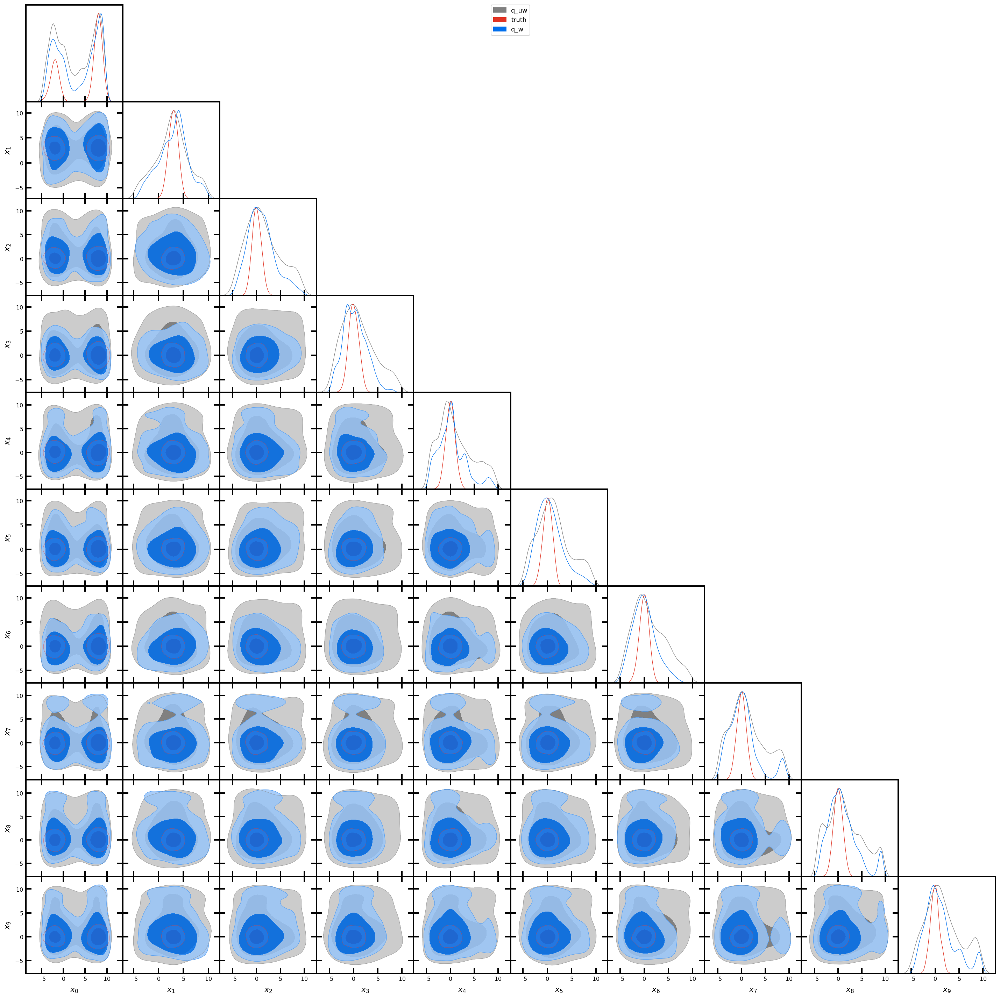

In [11]:
plot_corr_grv(grv10snf) 

<hr style="border:2px solid gray"> </hr>


# Extra

### CG at the same settings as sampling but with no latent sampling

Removed no burn in
Removed no burn in
Removed no burn in


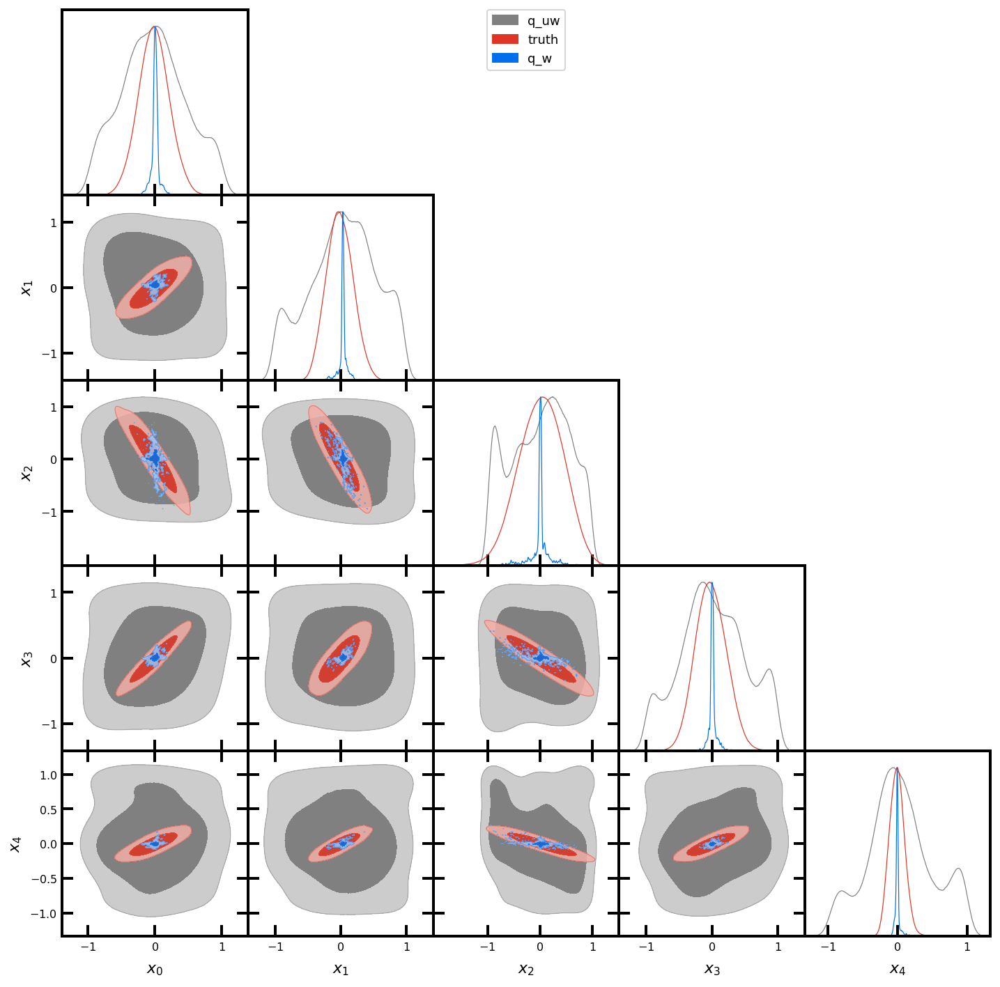

In [7]:
plot_corr_gd(cg5,Cov) #d=0 

## Varying a few new things

### $p \geq \{5\%,10\%,33\%\}p_{\rm{max}}$ 


In [22]:
n=5
ls,vl = np.log(np.array([0.05,0.1,.33])),[]
for l in ls: vl.append(run_nfo(n=n,log_like=log_like_cg,log_prior=log_flat_prior,top_verbose=False,
                               logp_cut=l))

Inference mode is optimization. Maximum beta is: 1.5
Inference mode is optimization. Maximum beta is: 1.5
Inference mode is optimization. Maximum beta is: 1.5


Removed no burn in
Removed no burn in
Removed no burn in


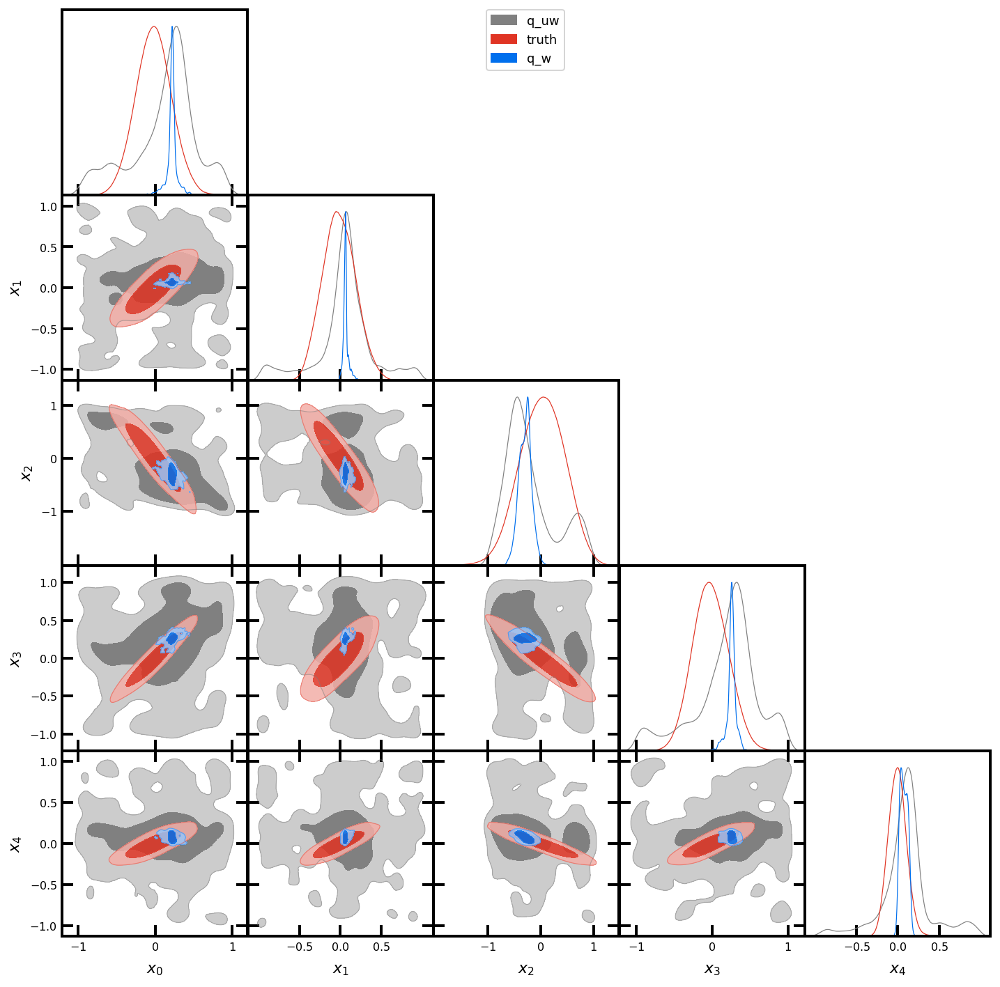

Removed no burn in
Removed no burn in
Removed no burn in


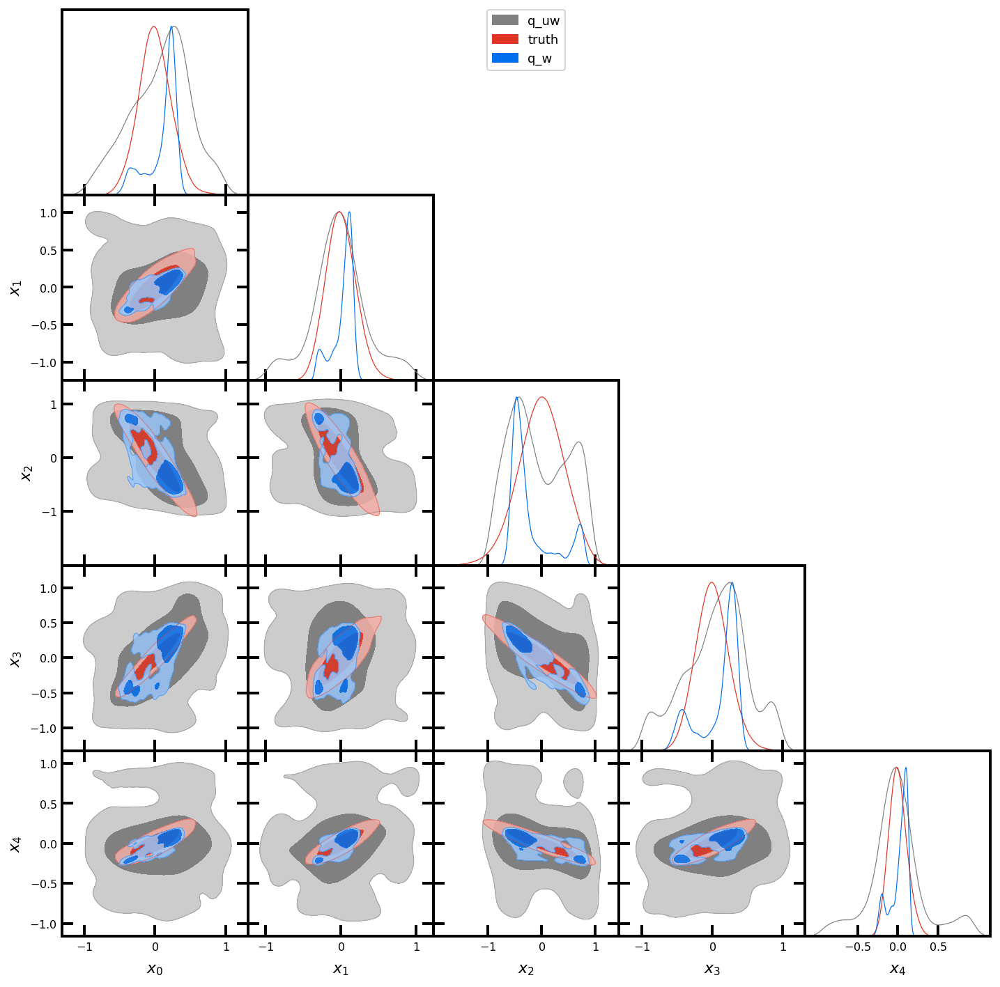

Removed no burn in
Removed no burn in
Removed no burn in


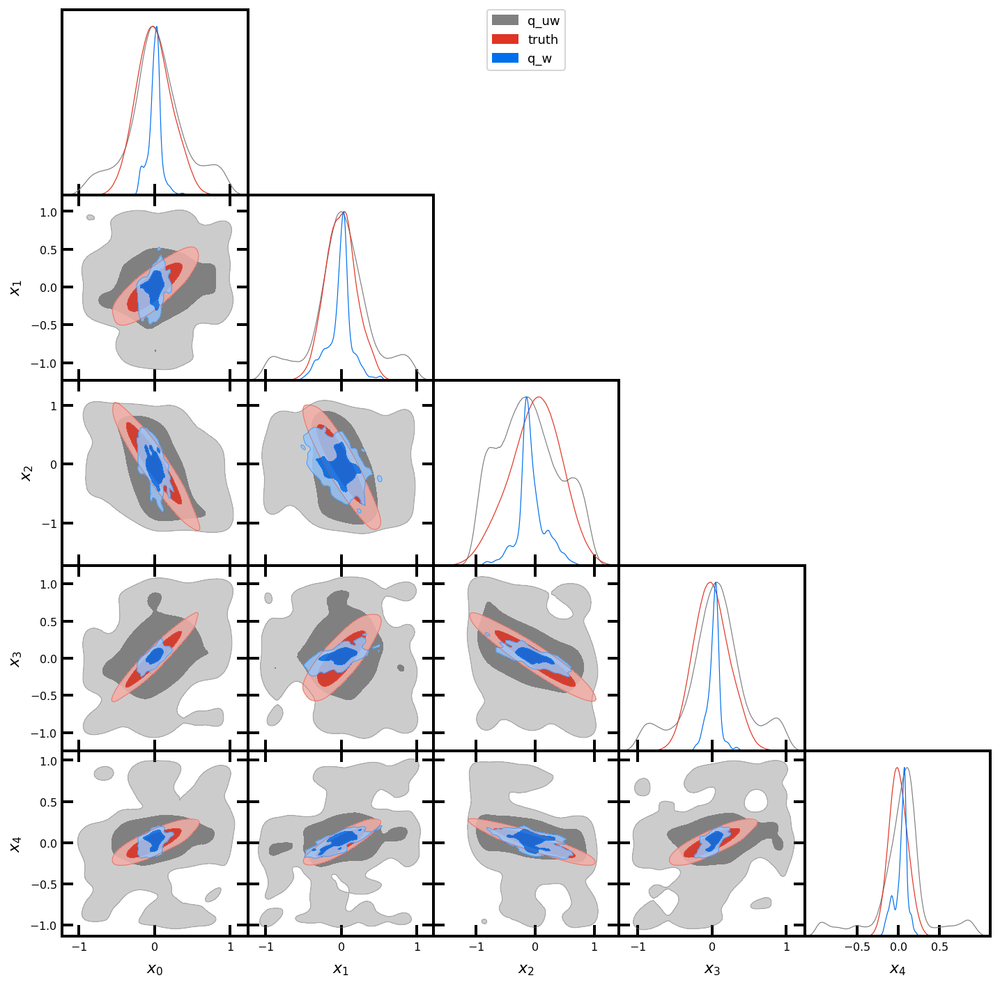

In [18]:
for t in vl: plot_corr_gd(t,Cov) #old default settings

### $\beta_{\rm{max}}=\{1,1.5,2,5\}$

In [81]:
bes,vbe = [1,1.5,2.,5.],[]
for be in bes: vbe.append(run_nfo(n=n,log_like=log_like_cg,log_prior=log_flat_prior,top_verbose=False,beta_max=be))

Inference mode is optimization. Maximum beta is: 1
Inference mode is optimization. Maximum beta is: 1.5
Inference mode is optimization. Maximum beta is: 2.0
Inference mode is optimization. Maximum beta is: 5.0


Removed no burn in
Removed no burn in
Removed no burn in


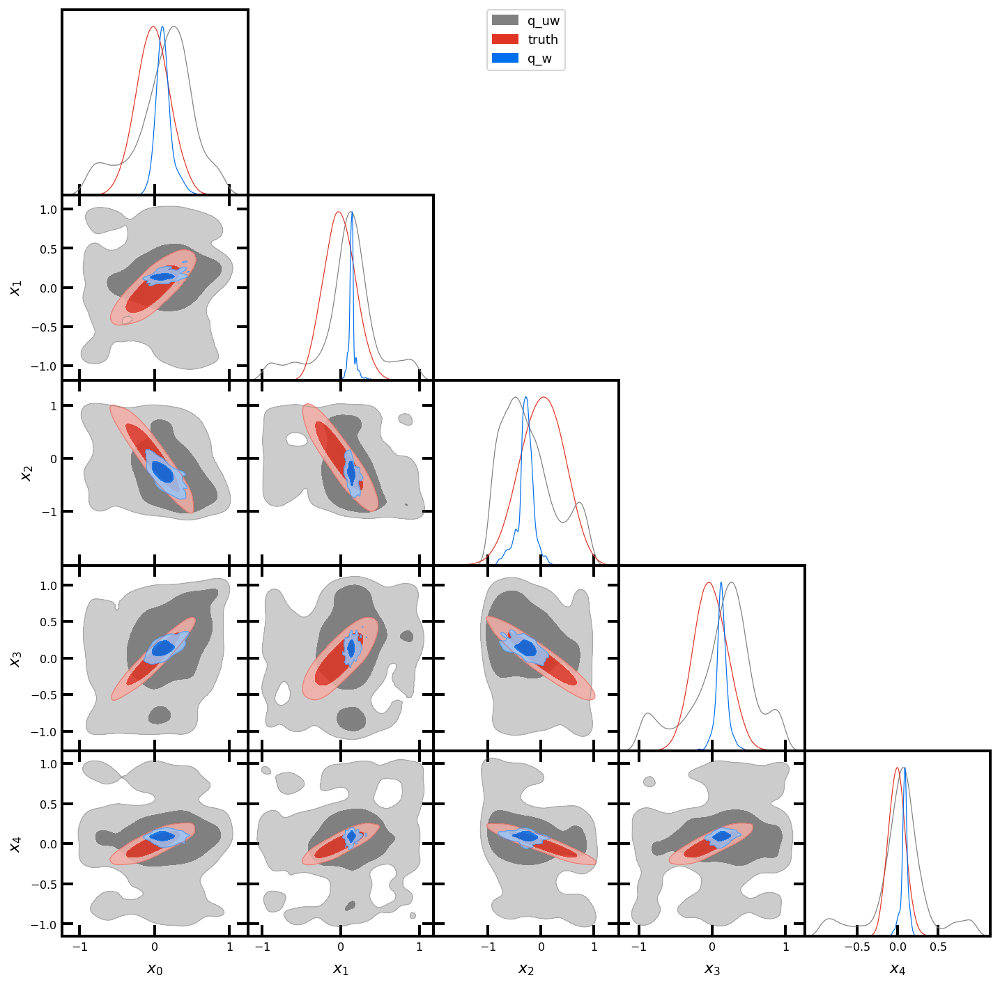

Removed no burn in
Removed no burn in
Removed no burn in


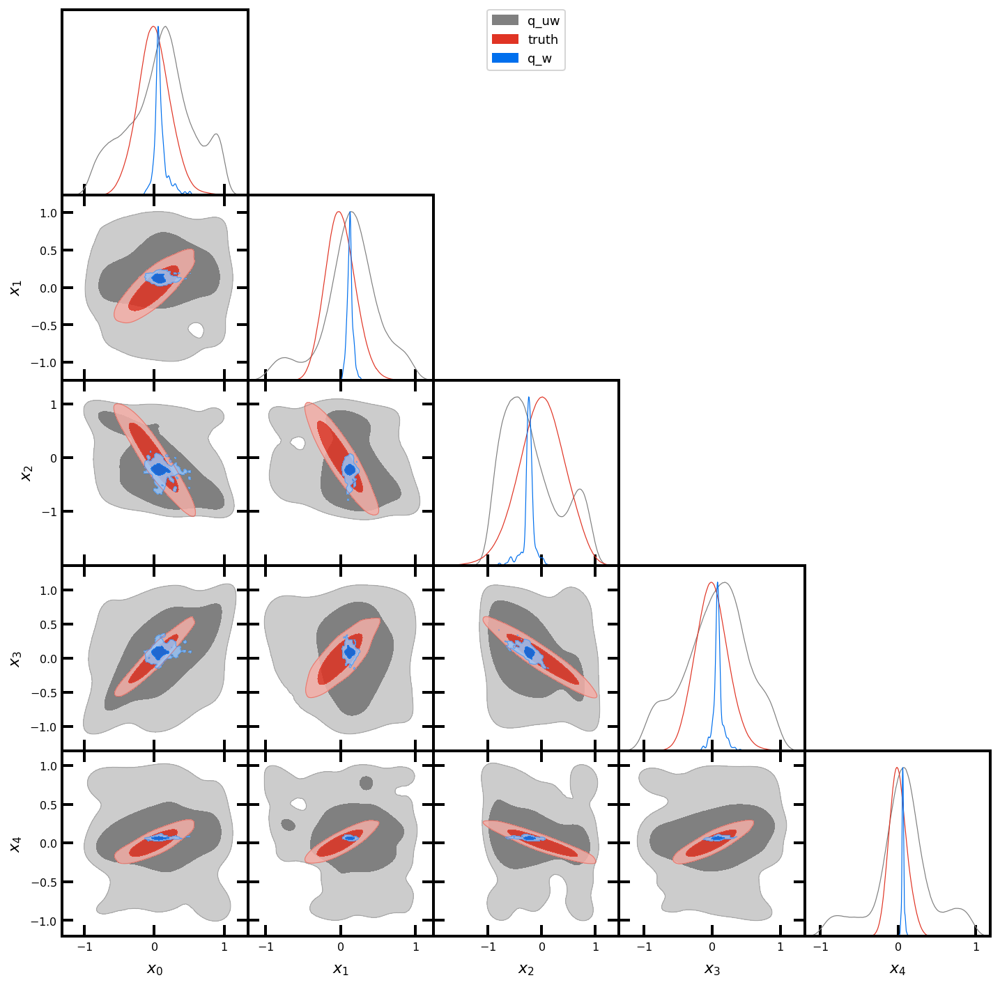

Removed no burn in
Removed no burn in
Removed no burn in


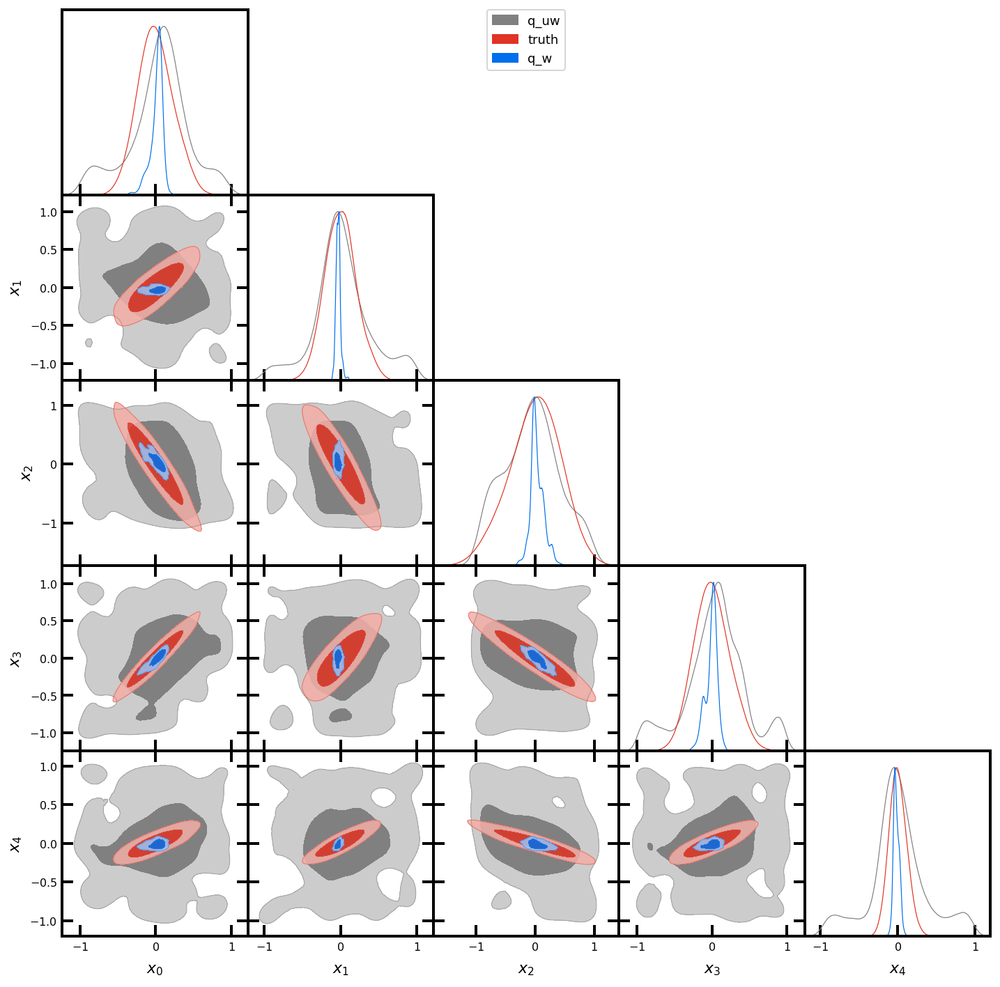

Removed no burn in
Removed no burn in
Removed no burn in


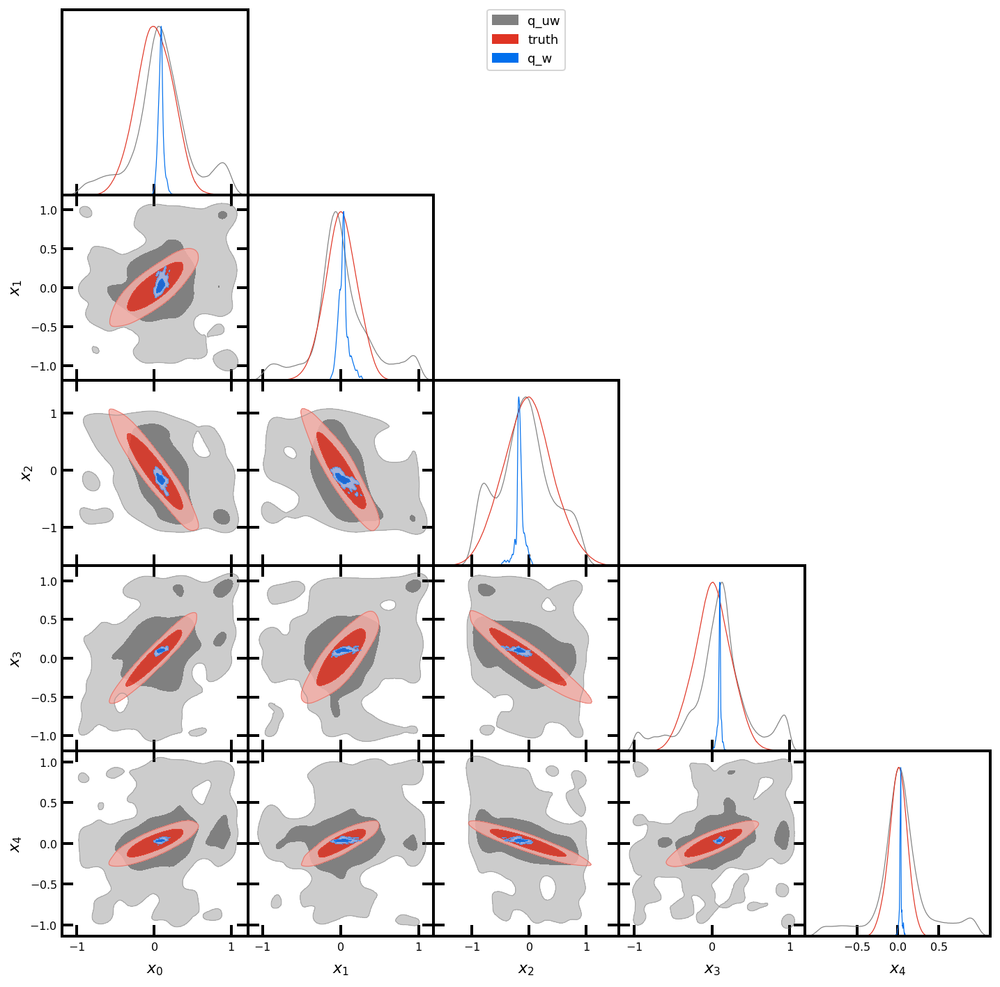

In [82]:
for t in vbe: plot_corr_gd(t,Cov)